<a href="https://colab.research.google.com/github/OlgaShishikina/kaggle/blob/main/Housing%20Prices%20Competition%20for%20Kaggle%20Learn%20Users/Housing_Prices_Competition_best_catboost.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Kaggle Предсказание цены дома

## Описание проекта

## План проекта


## Описание данных

 SalePrice - the property's sale price in dollars. This is the target variable that you're trying to predict.

MSSubClass: The building class

MSZoning: The general zoning classification

LotFrontage: Linear feet of street connected to property

LotArea: Lot size in square feet

Street: Type of road access

Alley: Type of alley access

LotShape: General shape of property

LandContour: Flatness of the property

Utilities: Type of utilities available

LotConfig: Lot configuration

LandSlope: Slope of property

Neighborhood: Physical locations within Ames city limits

Condition1: Proximity to main road or railroad

Condition2: Proximity to main road or railroad (if a second is present)

BldgType: Type of dwelling

HouseStyle: Style of dwelling

OverallQual: Overall material and finish quality

OverallCond: Overall condition rating

YearBuilt: Original construction date

YearRemodAdd: Remodel date

RoofStyle: Type of roof

RoofMatl: Roof material

Exterior1st: Exterior covering on house

Exterior2nd: Exterior covering on house (if more than one material)

MasVnrType: Masonry veneer type

MasVnrArea: Masonry veneer area in square feet

ExterQual: Exterior material quality

ExterCond: Present condition of the material on the exterior

Foundation: Type of foundation

BsmtQual: Height of the basement

BsmtCond: General condition of the basement

BsmtExposure: Walkout or garden level basement walls

BsmtFinType1: Quality of basement finished area

BsmtFinSF1: Type 1 finished square feet

BsmtFinType2: Quality of second finished area (if present)

BsmtFinSF2: Type 2 finished square feet

BsmtUnfSF: Unfinished square feet of basement area

TotalBsmtSF: Total square feet of basement area

Heating: Type of heating

HeatingQC: Heating quality and condition

CentralAir: Central air conditioning

Electrical: Electrical system

1stFlrSF: First Floor square feet

2ndFlrSF: Second floor square feet

LowQualFinSF: Low quality finished square feet (all floors)

GrLivArea: Above grade (ground) living area square feet

BsmtFullBath: Basement full bathrooms

BsmtHalfBath: Basement half bathrooms

FullBath: Full bathrooms above grade

HalfBath: Half baths above grade

Bedroom: Number of bedrooms above basement level

Kitchen: Number of kitchens

KitchenQual: Kitchen quality

TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)

Functional: Home functionality rating

Fireplaces: Number of fireplaces

FireplaceQu: Fireplace quality

GarageType: Garage location

GarageYrBlt: Year garage was built

GarageFinish: Interior finish of the garage

GarageCars: Size of garage in car capacity

GarageArea: Size of garage in square feet

GarageQual: Garage quality

GarageCond: Garage condition

PavedDrive: Paved driveway

WoodDeckSF: Wood deck area in square feet

OpenPorchSF: Open porch area in square feet

EnclosedPorch: Enclosed porch area in square feet

3SsnPorch: Three season porch area in square feet

ScreenPorch: Screen porch area in square feet

PoolArea: Pool area in square feet

PoolQC: Pool quality

Fence: Fence quality

MiscFeature: Miscellaneous feature not covered in other categories

MiscVal: $Value of miscellaneous feature

MoSold: Month Sold

YrSold: Year Sold

SaleType: Type of sale

SaleCondition: Condition of sale

**Текст, выделенный полужирным шрифтом**

In [4]:
pip install phik

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 5.5 MB/s eta 0:00:00


In [5]:
pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 6.3 MB/s eta 0:00:00


In [6]:
# импорт библиотек
import pandas as pd
import time
import scipy.stats as st
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.model_selection import  RandomizedSearchCV, train_test_split, cross_val_score
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, MinMaxScaler,OneHotEncoder,LabelEncoder
from sklearn.metrics import (
    accuracy_score,
    roc_auc_score
)
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.metrics import mean_squared_error
# загружаем нужные классы
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
# класс для работы с пропусками
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMClassifier
import lightgbm as lgb
# отключаем предупреждения
import warnings
import re
from phik import phik_matrix
from phik.report import plot_correlation_matrix
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression, SGDRegressor, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

/usr/local/lib/python3.11/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


## Функции

In [213]:
def missing_data (all_data):
  all_data_na = (all_data.isnull().sum() / len(all_data)) * 100
  all_data_na = all_data_na.drop(all_data_na[all_data_na == 0].index).sort_values(ascending=False)[:30]
  missing_data = pd.DataFrame({'Missing Ratio' :all_data_na})
  missing_data.head(30)

In [7]:
#Функции
def analyze_outliers(df, col):
  '''поиск выбросов с помощью IQR'''
  Q3 = np.quantile(df[col], 0.75, axis=0)
  Q1 = np.quantile(df[col], 0.25, axis=0)
  IQR = Q3 - Q1
  upper = round(Q3 + 1.5 * IQR, 2)
  lower = round(Q1 - 1.5 * IQR, 2)
  if round(Q1 - 1.5 * IQR, 2)<0:
    lower = 0
  print('____________________________________________________________________')
  print(f'интервал фактических значений для переменной {col} от {round(df[col].min(),2)} до {round(df[col].max(),2)}')
  print(f'интервал нормальных значений для переменной {col} от {lower} до {upper}')

  print(f'переменная {col} содержит аномальных значений : {round(df[(df[col]>upper)| (df[col]<lower)].shape[0]/df.shape[0]*100, 2)}%')

  if df[(df[col] == 0)].shape[0]>0:
    print(f'переменная {col} содержит нулевые значения {round(df[(df[col] == 0)].shape[0]/df.shape[0]*100, 2)}%')

  return lower, upper

In [8]:
# функция для построения гистограммы и ящика с усами

def hist_box(data,col):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
    #гистограмма
    sns.histplot(data = data, x = col, ax=axes[0], bins=50,kde=True)
    axes[0].set_title('гистограмма')
    axes[0].set_xlabel(col)
    axes[0].set_ylabel('колво')
    #ящик с усами
    sns.boxplot(data = data, x=col, ax=axes[1])
    axes[1].set_title('диаграмма размаха')
    fig.suptitle(col)
    plt.show()

In [9]:
# функция для построения графика для категориальных данных
def graf(data,col,label):
    print(data[col].value_counts())
    data[col].groupby(data[col]).count().plot(kind="pie",ylabel=label,fontsize=6);

In [10]:
def num_cat(df):
  numeric_features = df.select_dtypes(include=['float64', 'int64']).columns
  print('Числовые столбцы:',numeric_features)
  categorical_features = df.select_dtypes(include=['object']).columns
  print('Категориальные столбцы:',categorical_features)
  return numeric_features,categorical_features


In [11]:
# фиксируем константы
RANDOM_STATE = 91224

## Чтение данных

In [12]:
# чтение данных
try:
  train = pd.read_csv('train.csv')
  test = pd.read_csv('test.csv')
  print('load from current folder')
except:
  train = pd.read_csv('https://raw.githubusercontent.com/OlgaShishikina/kaggle/main/Housing%20Prices%20Competition%20for%20Kaggle%20Learn%20Users/train.csv')
  test = pd.read_csv('https://raw.githubusercontent.com/OlgaShishikina/kaggle/main/Housing%20Prices%20Competition%20for%20Kaggle%20Learn%20Users/test.csv')
  print('load from github')




load from github


In [13]:
# посмотрим на первые 5 строк трейн данных
display(train.head(5))

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [14]:
# посмотрим на первые 5 строк тест данных
display(test.head(5))

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [15]:
# Размер датасета
print(f"В тренировочном датасете: {train.shape[0]} строк")

# Information about columns and data types
print(f"\n В датасете {train.shape[1]} столбцов, из них :")
print(train.dtypes.value_counts())

В тренировочном датасете: 1460 строк

 В датасете 81 столбцов, из них :
object     43
int64      35
float64     3
Name: count, dtype: int64


In [16]:
# Размер датасета
print(f"В тестовом датасете: {test.shape[0]} строк")

# Information about columns and data types
print(f"\n В датасете {test.shape[1]} столбцов, из них :")
print(test.dtypes.value_counts())

В тестовом датасете: 1459 строк

 В датасете 80 столбцов, из них :
object     43
int64      26
float64    11
Name: count, dtype: int64


In [17]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [18]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

**Вывод:**

я импортировала нужные библиотеки, прочла данные, ознакомилась с ними. Предстоит работа с двумя датасетами - тренировочном и тестовом данными

## Исследовательский анализ данных  EDA

красивый вывод пропусков и их график

In [264]:
all_data_na = (train.isnull().sum() / len(train)) * 100
all_data_na = all_data_na.drop(all_data_na[all_data_na == 0].index).sort_values(ascending=False)[:30]
missing_data = pd.DataFrame({'Missing Ratio' :all_data_na})
missing_data.head(30)

,Missing Ratio
PoolQC,99.520548
MiscFeature,96.301370
Alley,93.767123
Fence,80.753425
MasVnrType,59.726027
FireplaceQu,47.260274
LotFrontage,17.739726
GarageType,5.547945
GarageYrBlt,5.547945
GarageFinish,5.547945


In [265]:
all_numerical = train.select_dtypes(include=np.number).columns.tolist()
missing_data.index.values.tolist()
missing_df = train[missing_data.index.values.tolist()]
missing_numerical = missing_df.select_dtypes(include=np.number).columns.tolist()

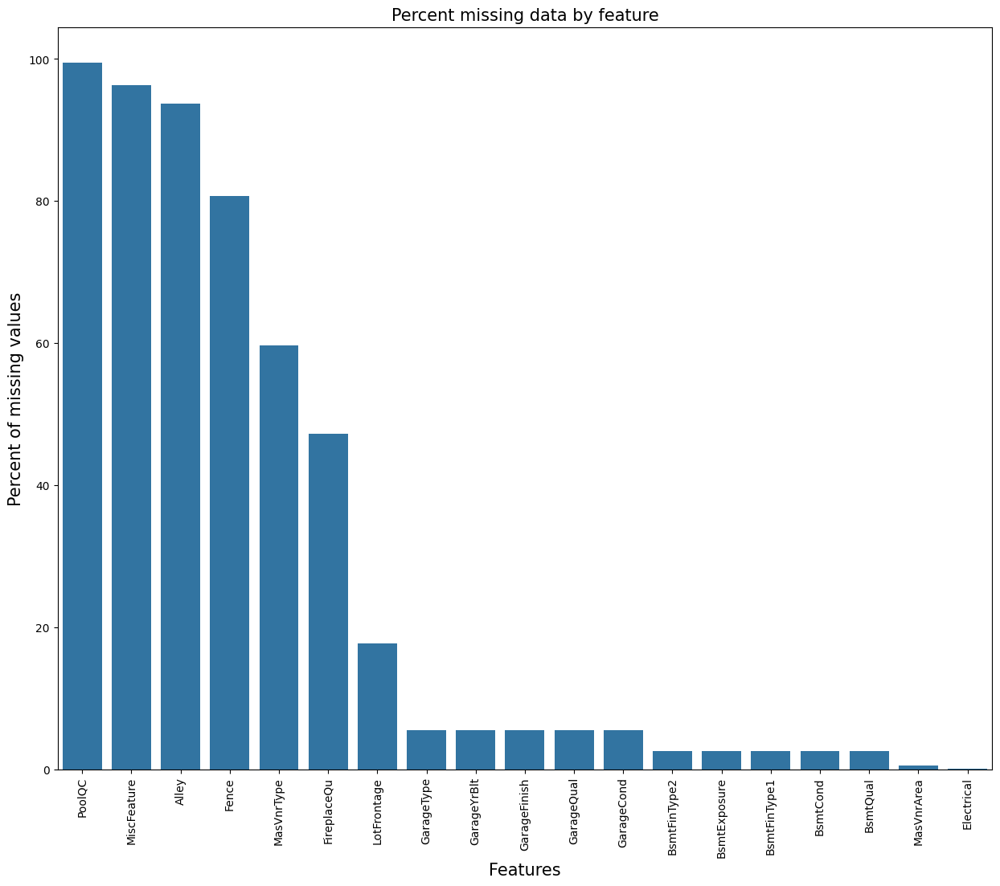

In [268]:
f, ax = plt.subplots(figsize=(15, 12))
plt.xticks(rotation='vertical')
sns.barplot(x=all_data_na.index, y=all_data_na)
plt.xlabel('Features', fontsize=15)
plt.ylabel('Percent of missing values', fontsize=15)
plt.title('Percent missing data by feature', fontsize=15);

### Тренировочный набор

In [19]:
print("\n Статистика по столбцам train:")
train.describe().T


 Статистика по столбцам train:


,count,mean,std,min,25%,50%,75%,max
Id,1460.0,730.500000,421.610009,1.0,365.75,730.5,1095.25,1460.0
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0


In [20]:
def num_cat(df):
  numeric_features = df.select_dtypes(include=['float64', 'int64']).columns
  print('Числовые столбцы:',numeric_features)
  categorical_features = df.select_dtypes(include=['object']).columns
  print('Категориальные столбцы:',categorical_features)
  return numeric_features,categorical_features


In [21]:
numeric_features,categorical_features =  num_cat(train)

Числовые столбцы: Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')
Категориальные столбцы: Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinT

In [22]:
for col in numeric_features:
  analyze_outliers(train, col)

____________________________________________________________________
интервал фактических значений для переменной Id от 1 до 1460
интервал нормальных значений для переменной Id от 0 до 2189.5
переменная Id содержит аномальных значений : 0.0%
____________________________________________________________________
интервал фактических значений для переменной MSSubClass от 20 до 190
интервал нормальных значений для переменной MSSubClass от 0 до 145.0
переменная MSSubClass содержит аномальных значений : 7.05%
____________________________________________________________________
интервал фактических значений для переменной LotFrontage от 21.0 до 313.0
интервал нормальных значений для переменной LotFrontage от nan до nan
переменная LotFrontage содержит аномальных значений : 0.0%
____________________________________________________________________
интервал фактических значений для переменной LotArea от 1300 до 215245
интервал нормальных значений для переменной LotArea от 1481.5 до 17673.5
перемен

In [23]:
# Класс здания
train.MSSubClass.describe()

,MSSubClass
count,1460.000000
mean,56.897260
std,42.300571
min,20.000000
25%,20.000000
50%,50.000000
75%,70.000000
max,190.000000


In [24]:
train.MSSubClass.unique()

array([ 60,  20,  70,  50, 190,  45,  90, 120,  30,  85,  80, 160,  75,
       180,  40])

можно заменить тип данных на целочисленный

In [25]:
train.MSSubClass = train.MSSubClass.astype('int64')

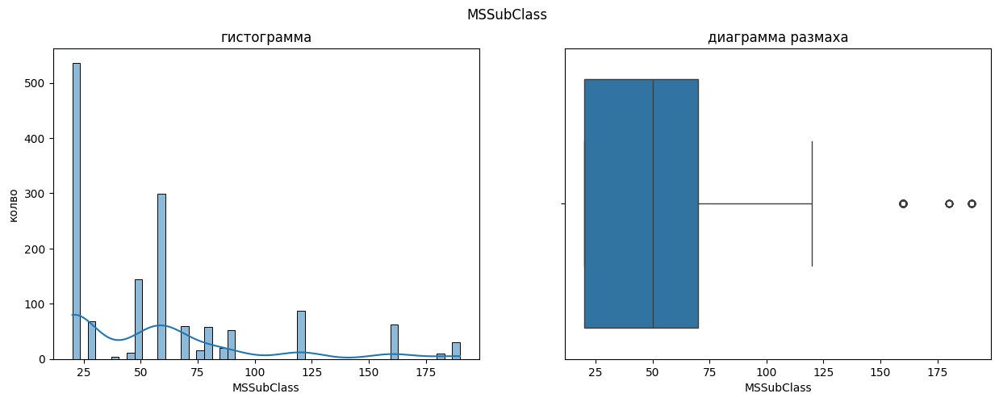

In [26]:
hist_box(train,'MSSubClass')

самый популярный класс здания - 20, таких зданий больше пятиста. Есть несколько выбросов.

In [27]:
train.MSSubClass.isna().sum()

0

пропусков нет

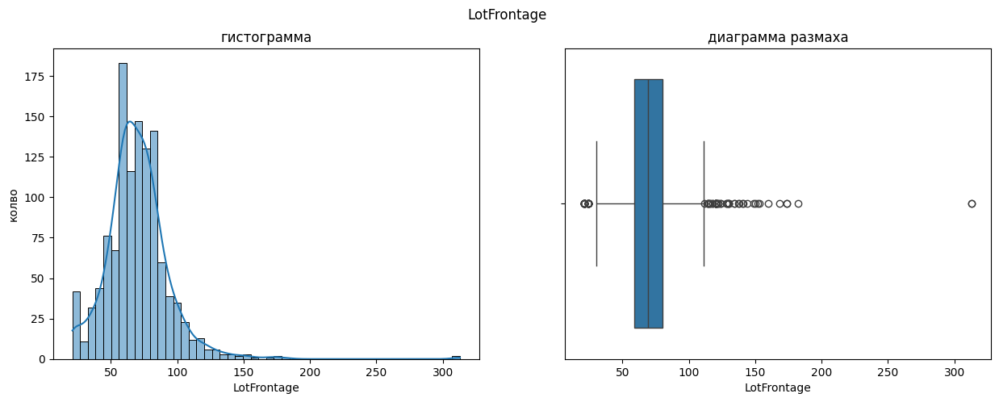

In [28]:
# Линейные футы улицы, примыкающей к участку
hist_box(train,'LotFrontage')

распределение нормальное, много выбросов,чаще всего около 70 футов.

In [29]:
train.LotFrontage.isna().sum()

259

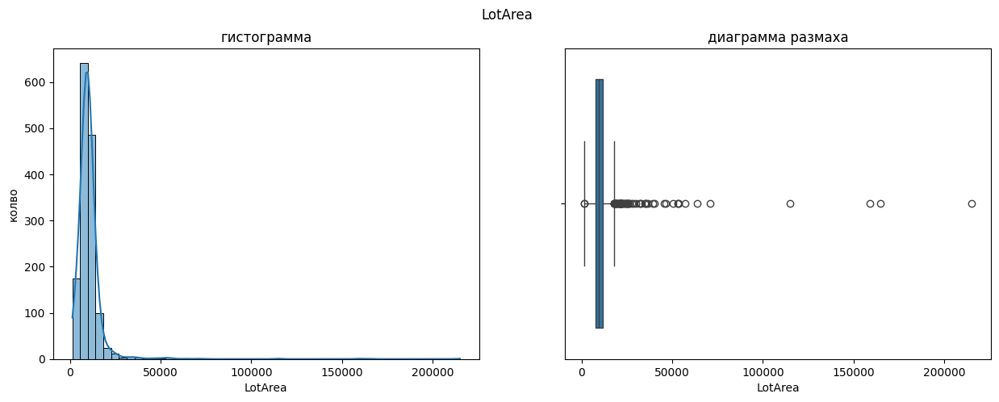

In [30]:
# Размер участка в квадратных футах
hist_box(train,'LotArea')


распределение нормальное, очень много выбросов

In [31]:
train.LotArea.isna().sum()

0

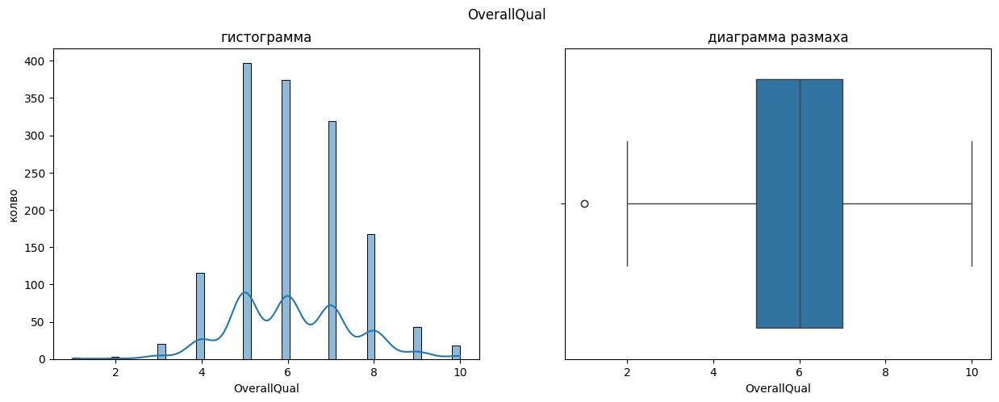

In [32]:
# Общее качество материалов и отделки
hist_box(train,'OverallQual')

столбец принимает значения от 1 до 10. чаще всего 5, самое редкое значение 1.

In [33]:
# Общее качество материалов и отделки
train.OverallQual.isna().sum()

0

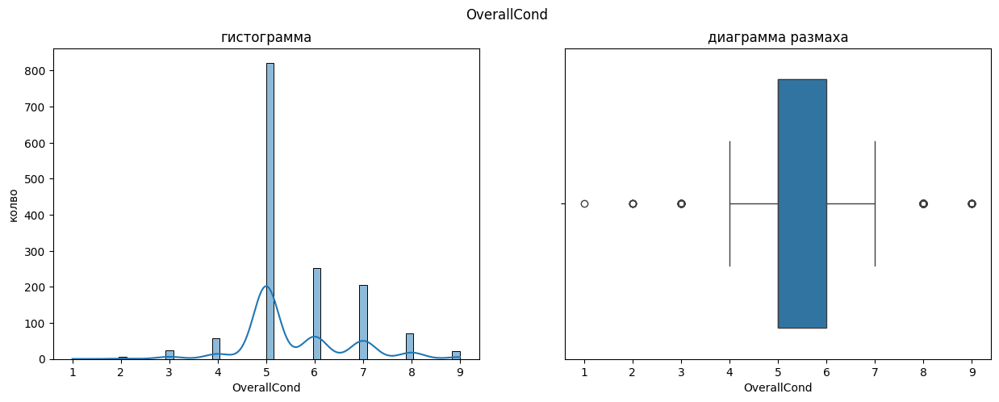

In [34]:
# Общая оценка состояния
hist_box(train,'OverallCond')

столбец принимает значения от 1 до 9. чаще всего 5, самое редкое значение 1.

In [35]:
train.OverallCond.isna().sum()

0

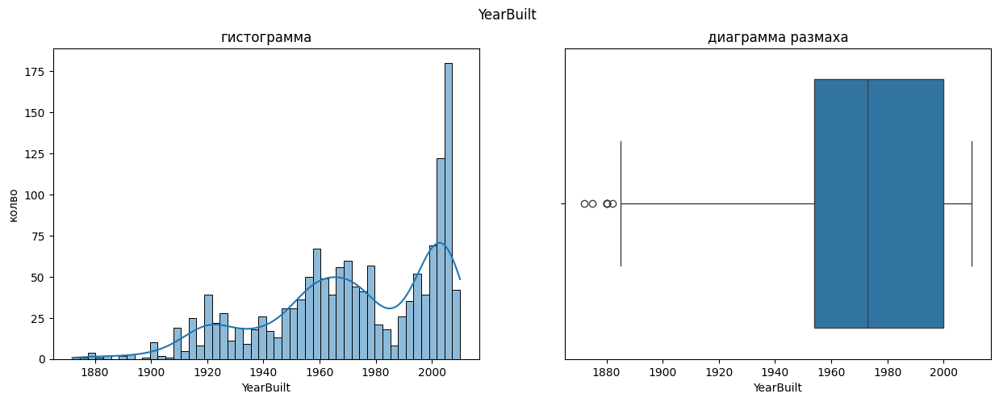

In [36]:
# год постройки
hist_box(train,'YearBuilt')

год постройки в диапазоне от 1879 до 2010 года. пик постройки приходится на 2006 года примерно.
есть выбросы в виде очень старых построек.

In [37]:
train.YearBuilt.isna().sum()

0

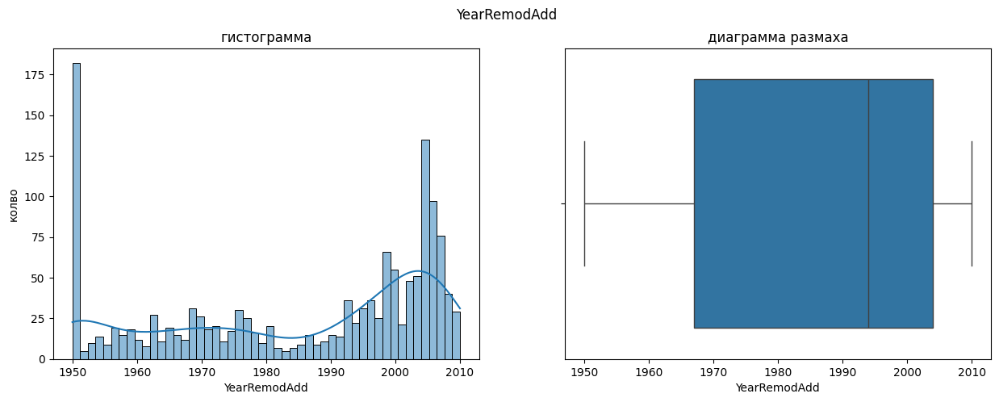

In [38]:
# год реконструкции
hist_box(train,'YearRemodAdd')

выбросов нет

In [39]:
train.YearRemodAdd.isna().sum()

0

In [40]:
test.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,1459.0,2190.000000,421.321334,1461.0,1825.50,2190.0,2554.50,2919.0
MSSubClass,1459.0,57.378341,42.746880,20.0,20.00,50.0,70.00,190.0
LotFrontage,1232.0,68.580357,22.376841,21.0,58.00,67.0,80.00,200.0
LotArea,1459.0,9819.161069,4955.517327,1470.0,7391.00,9399.0,11517.50,56600.0
OverallQual,1459.0,6.078821,1.436812,1.0,5.00,6.0,7.00,10.0
OverallCond,1459.0,5.553804,1.113740,1.0,5.00,5.0,6.00,9.0
YearBuilt,1459.0,1971.357779,30.390071,1879.0,1953.00,1973.0,2001.00,2010.0
YearRemodAdd,1459.0,1983.662783,21.130467,1950.0,1963.00,1992.0,2004.00,2010.0
MasVnrArea,1444.0,100.709141,177.625900,0.0,0.00,0.0,164.00,1290.0
BsmtFinSF1,1458.0,439.203704,455.268042,0.0,0.00,350.5,753.50,4010.0


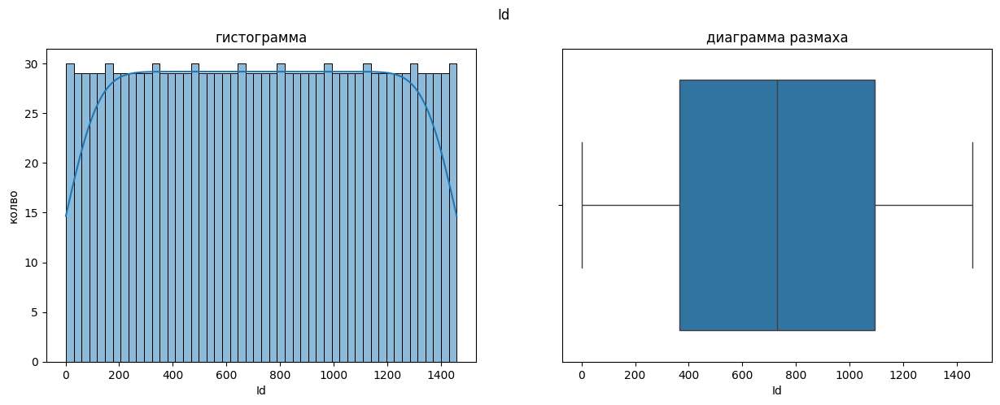

пропуски в столбце Id : 0


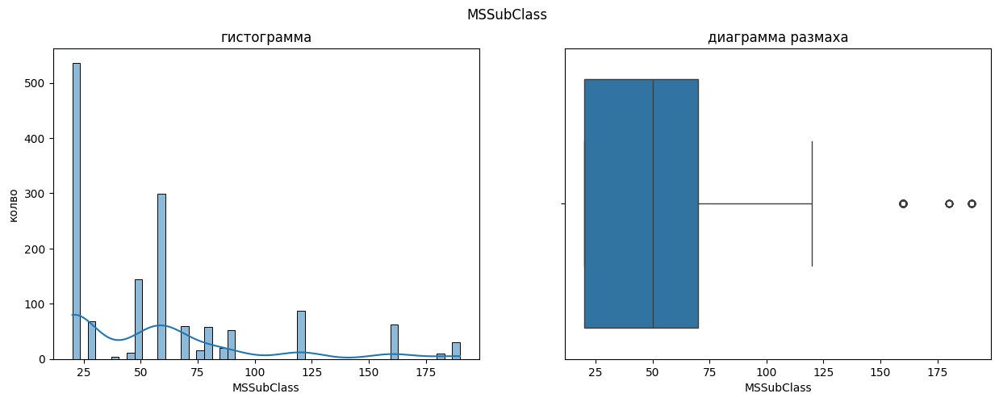

пропуски в столбце MSSubClass : 0


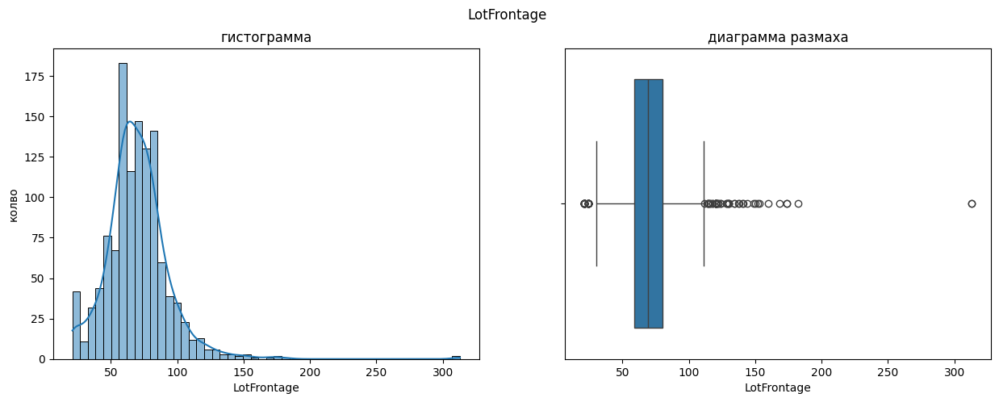

пропуски в столбце LotFrontage : 259


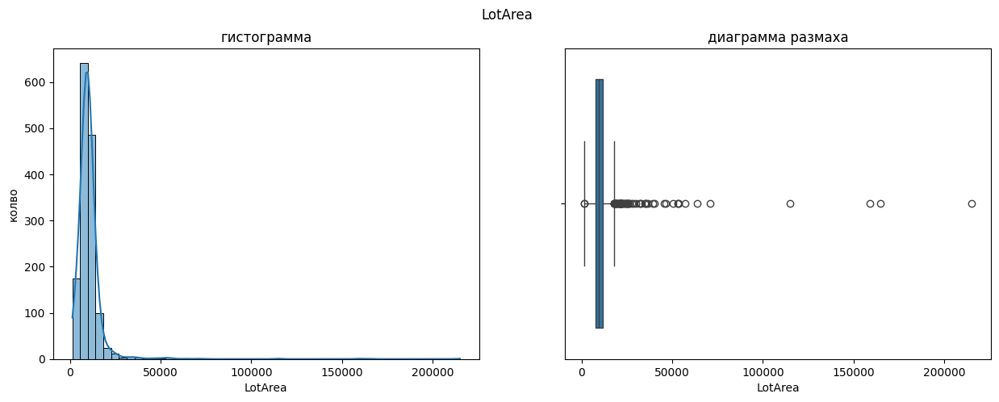

пропуски в столбце LotArea : 0


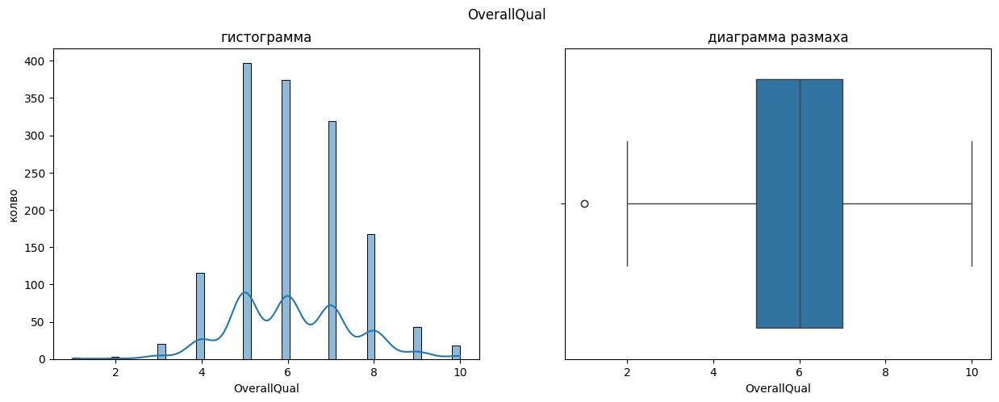

пропуски в столбце OverallQual : 0


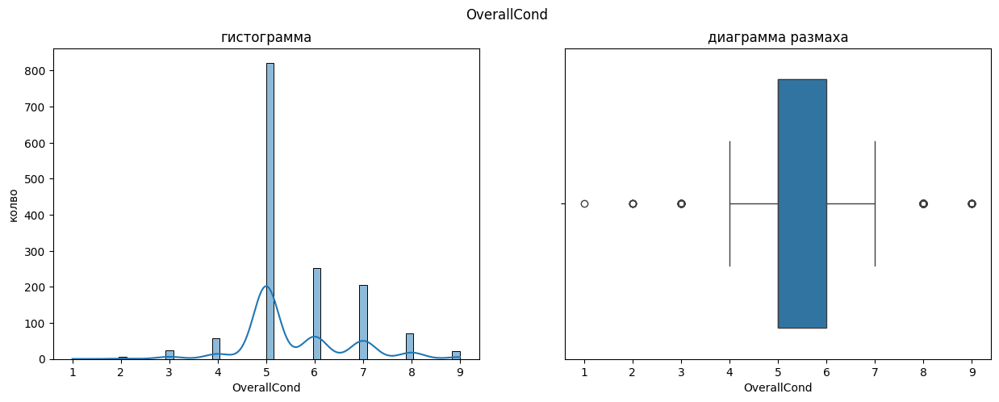

пропуски в столбце OverallCond : 0


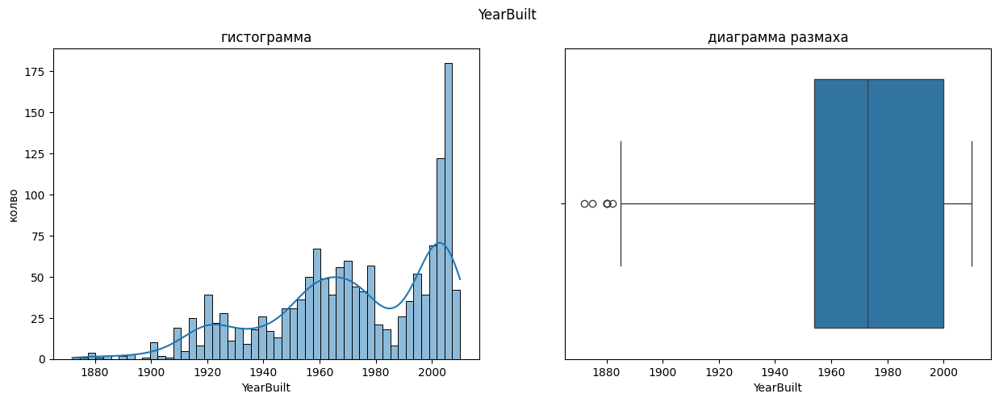

пропуски в столбце YearBuilt : 0


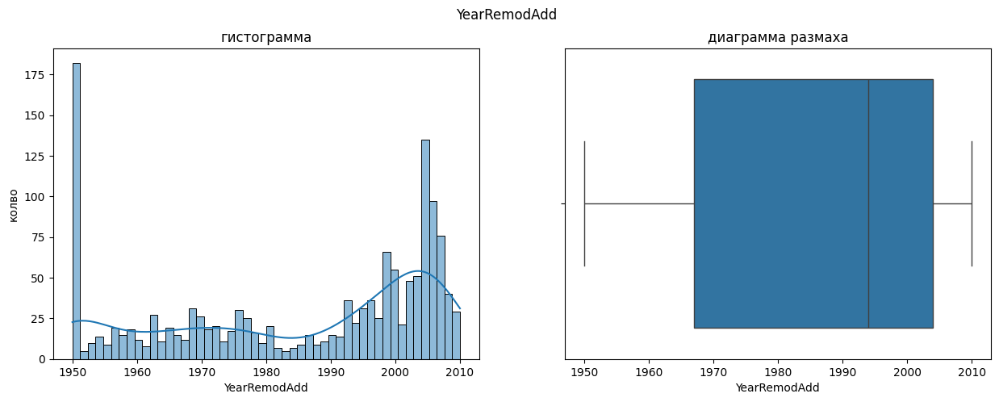

пропуски в столбце YearRemodAdd : 0


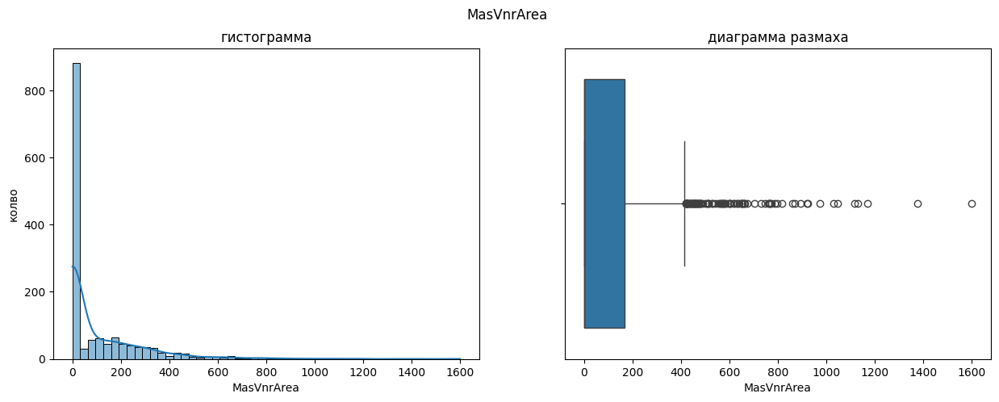

пропуски в столбце MasVnrArea : 8


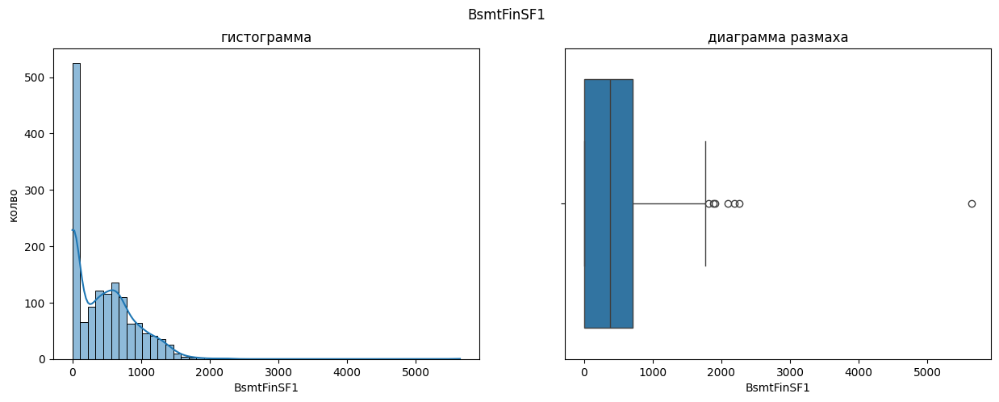

пропуски в столбце BsmtFinSF1 : 0


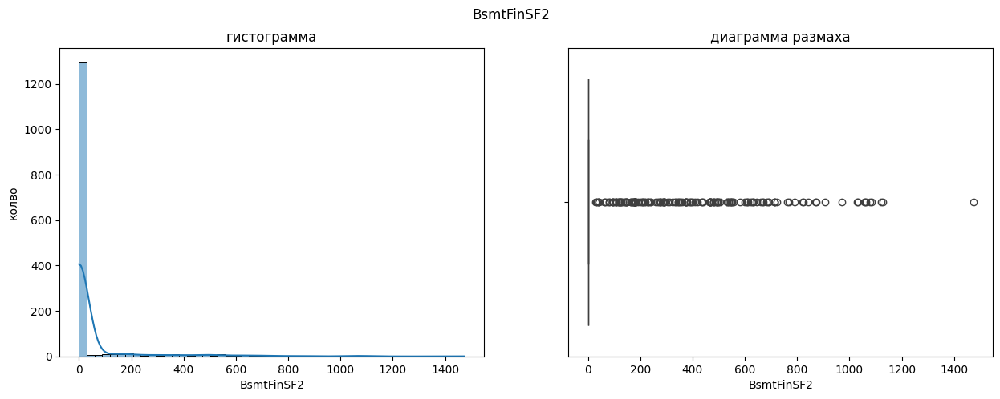

пропуски в столбце BsmtFinSF2 : 0


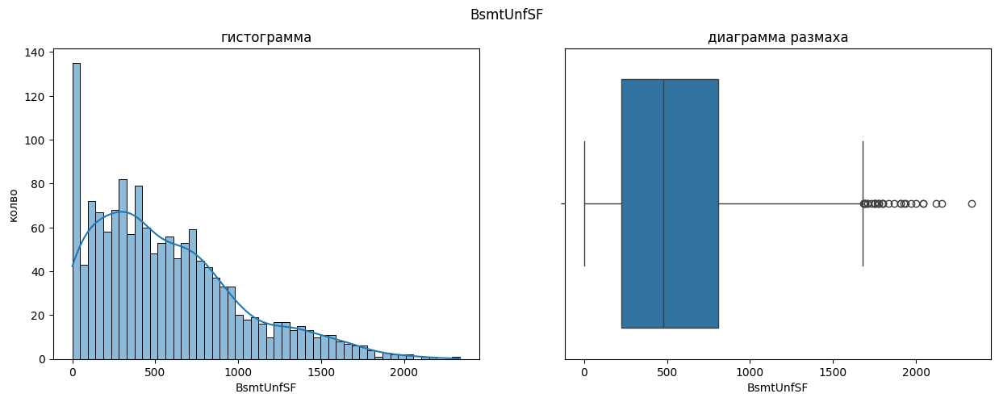

пропуски в столбце BsmtUnfSF : 0


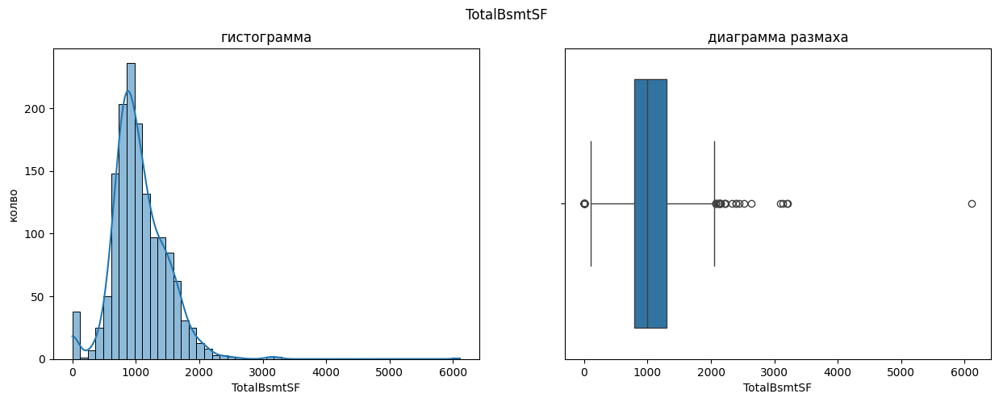

пропуски в столбце TotalBsmtSF : 0


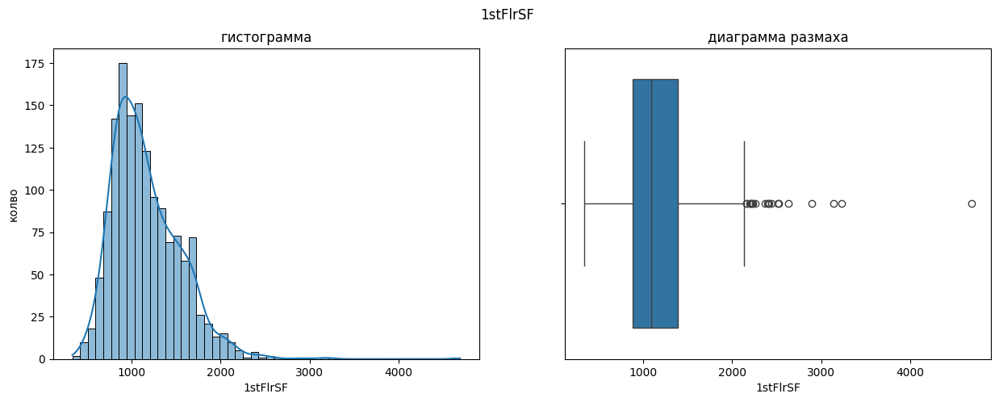

пропуски в столбце 1stFlrSF : 0


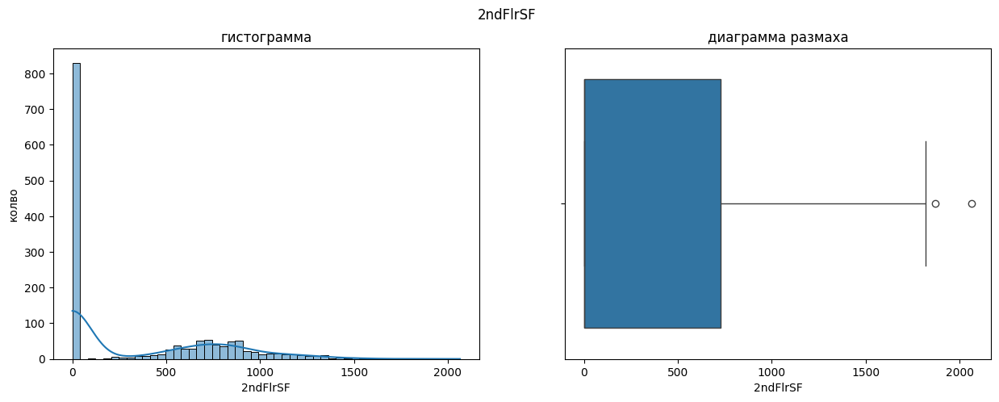

пропуски в столбце 2ndFlrSF : 0


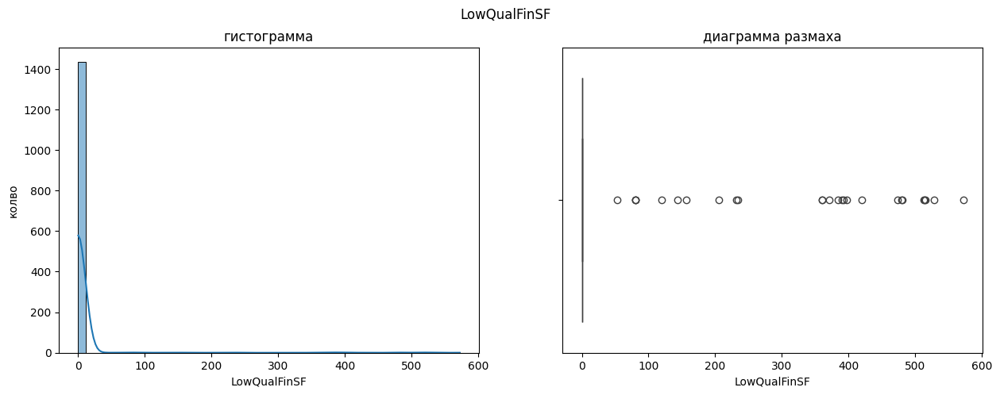

пропуски в столбце LowQualFinSF : 0


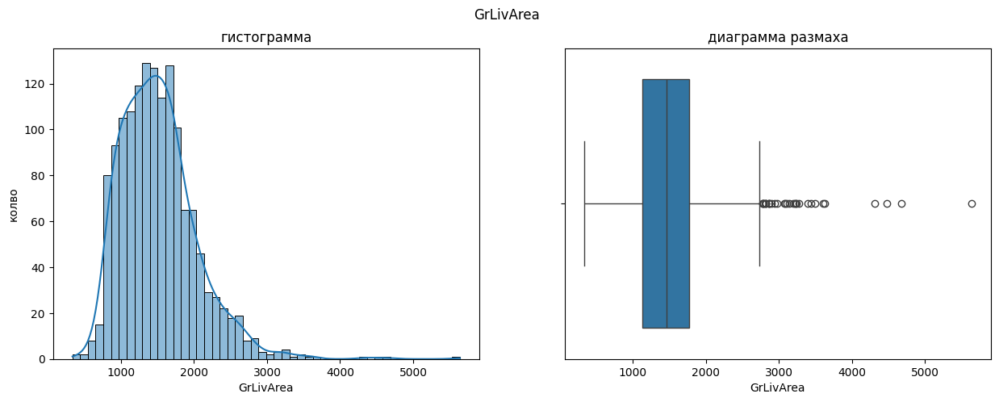

пропуски в столбце GrLivArea : 0


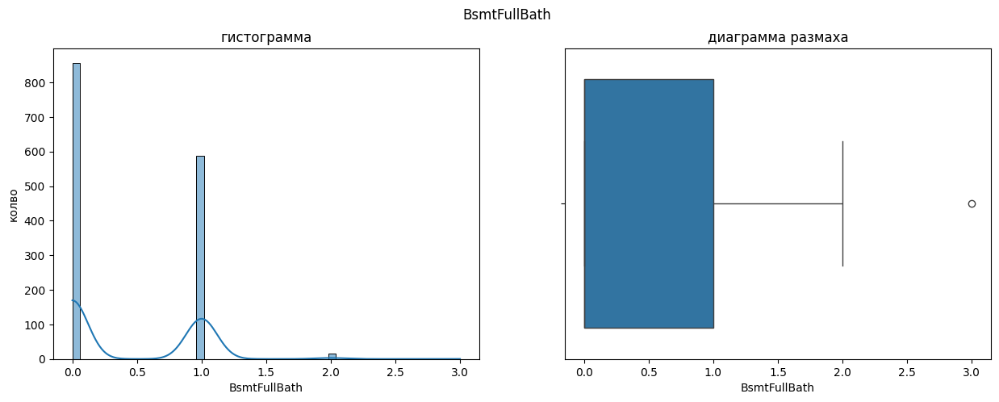

пропуски в столбце BsmtFullBath : 0


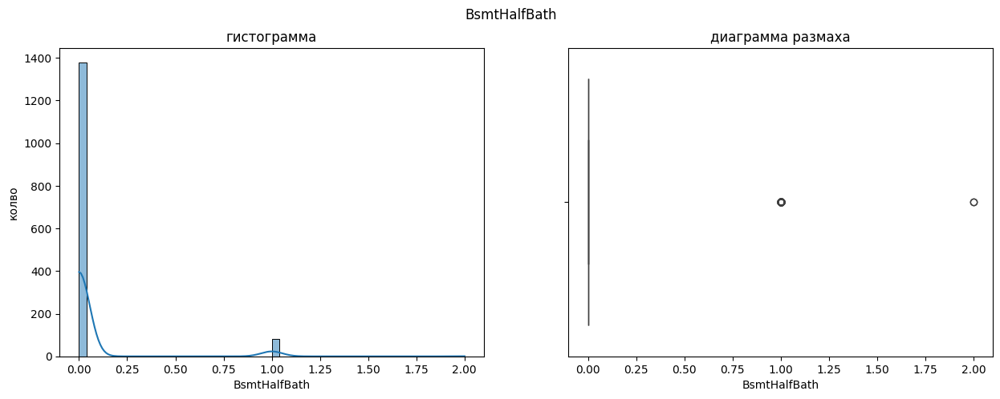

пропуски в столбце BsmtHalfBath : 0


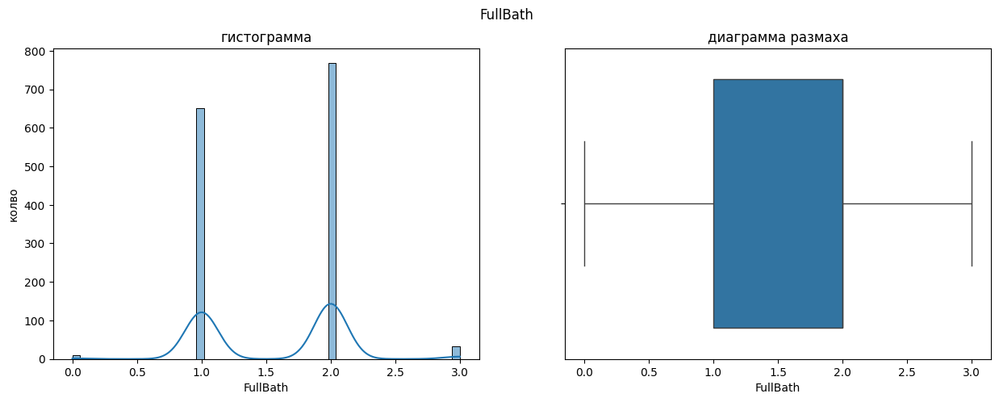

пропуски в столбце FullBath : 0


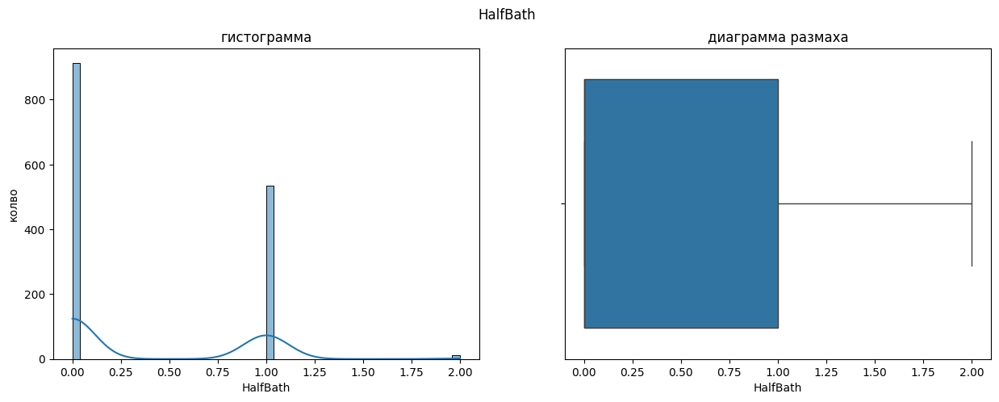

пропуски в столбце HalfBath : 0


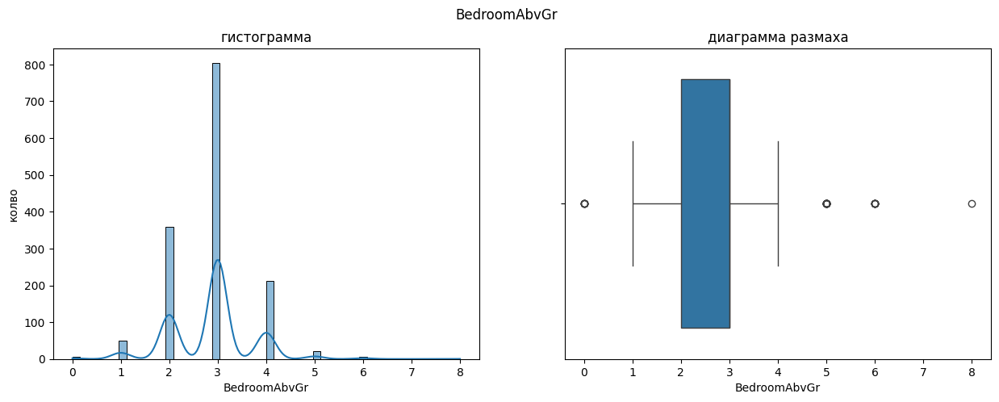

пропуски в столбце BedroomAbvGr : 0


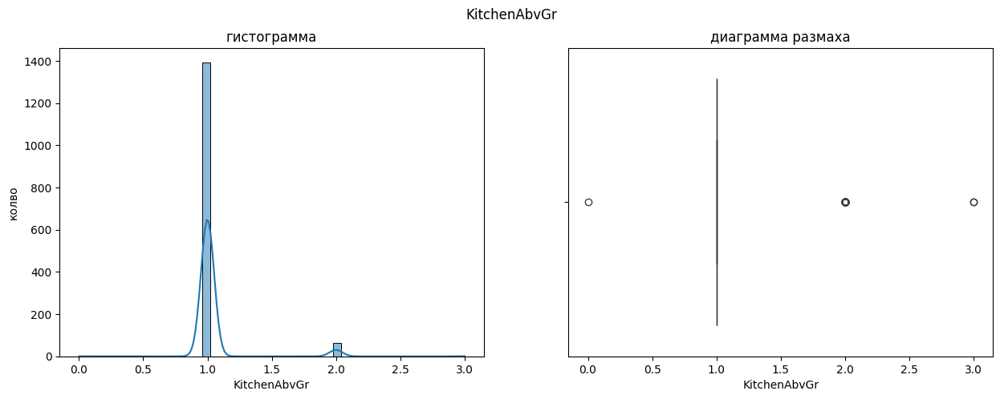

пропуски в столбце KitchenAbvGr : 0


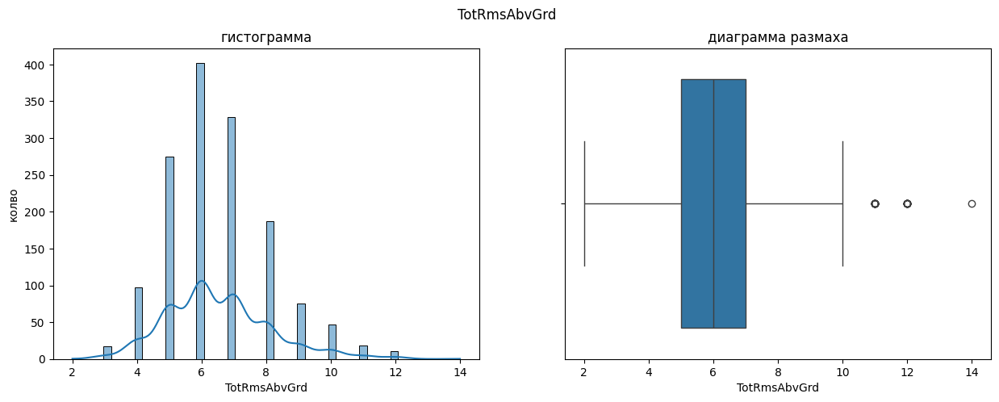

пропуски в столбце TotRmsAbvGrd : 0


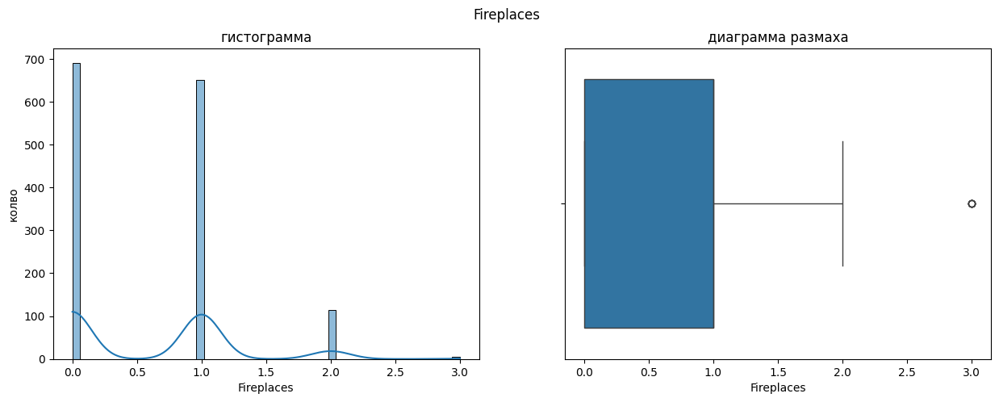

пропуски в столбце Fireplaces : 0


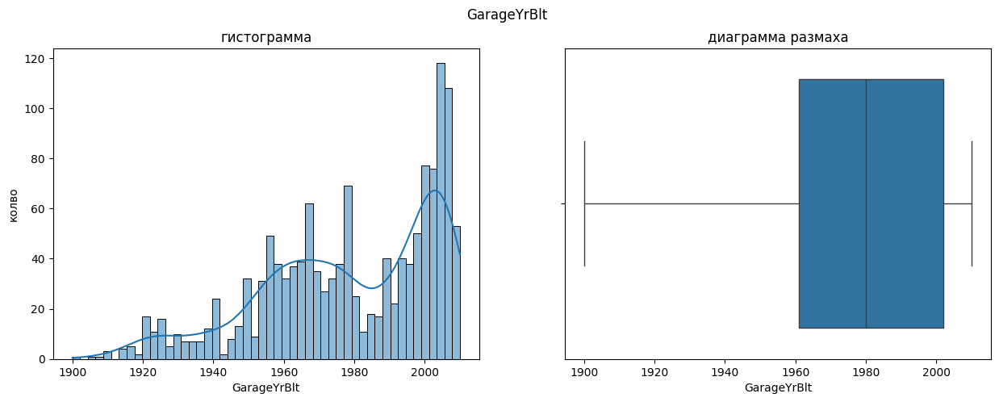

пропуски в столбце GarageYrBlt : 81


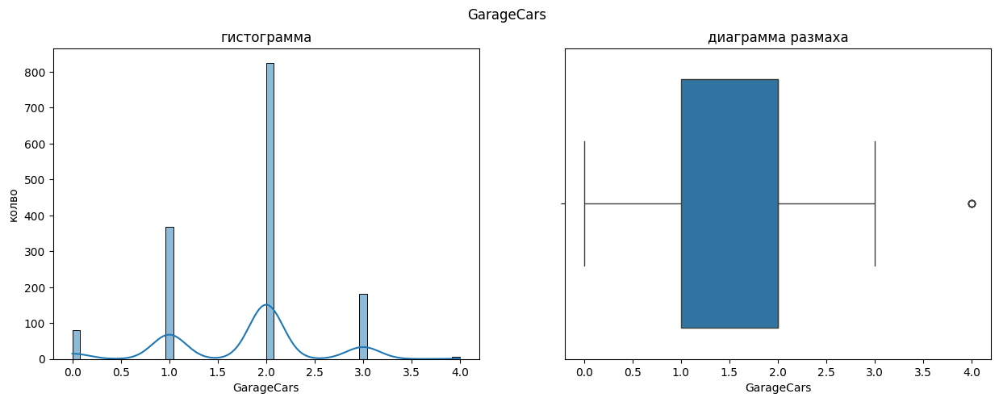

пропуски в столбце GarageCars : 0


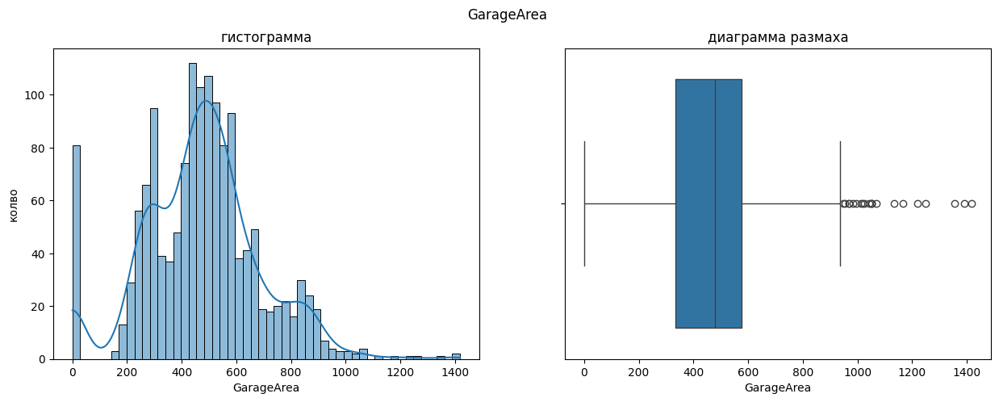

пропуски в столбце GarageArea : 0


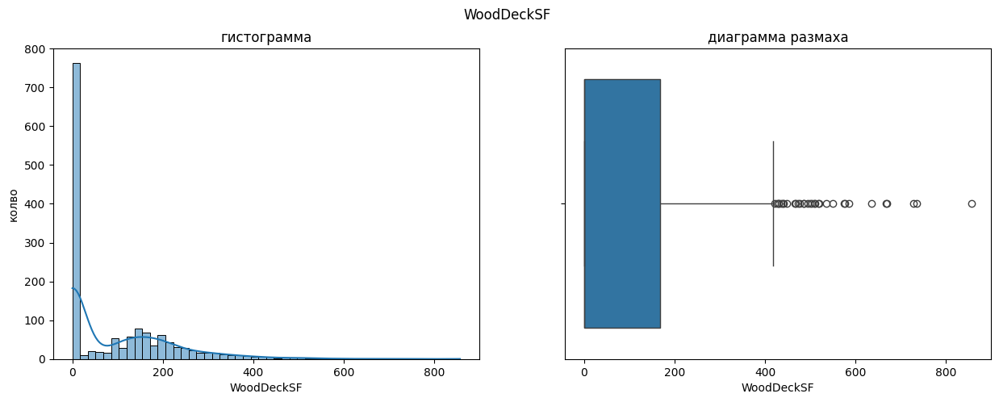

пропуски в столбце WoodDeckSF : 0


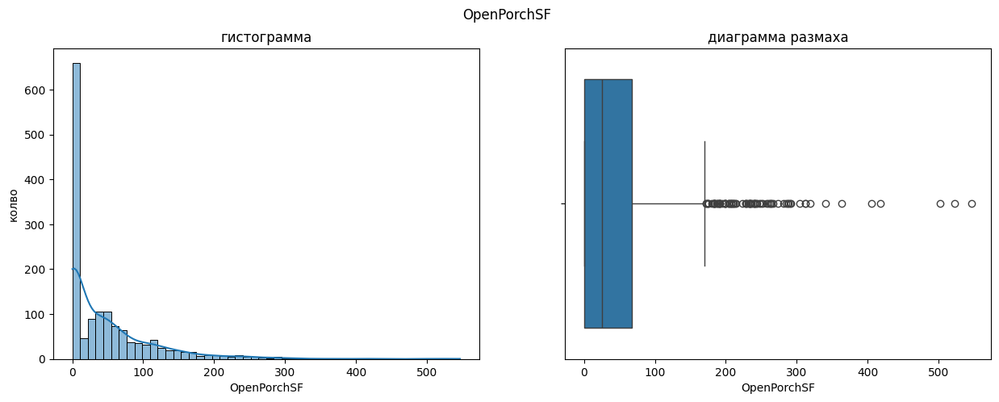

пропуски в столбце OpenPorchSF : 0


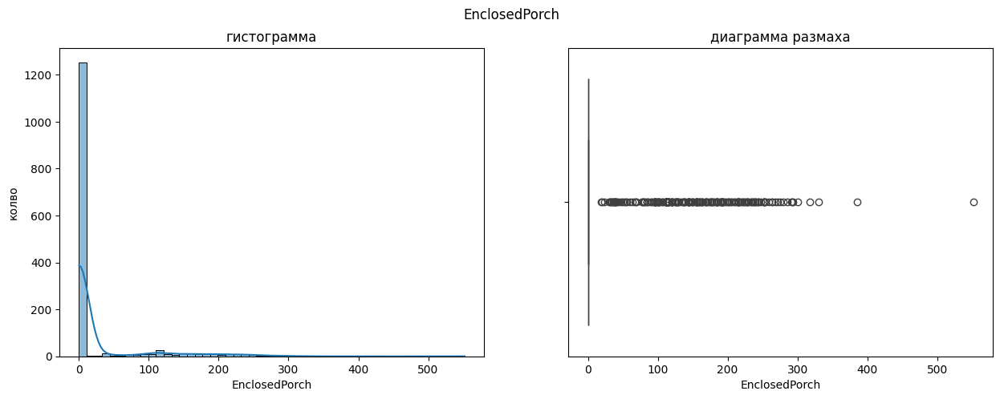

пропуски в столбце EnclosedPorch : 0


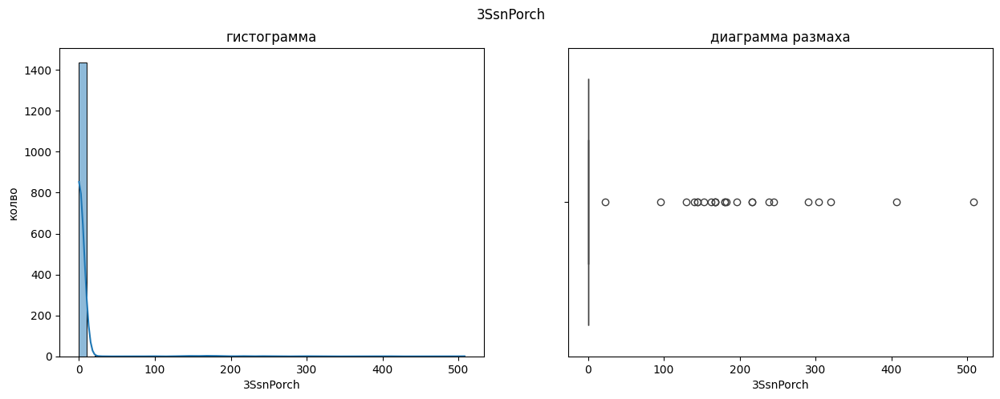

пропуски в столбце 3SsnPorch : 0


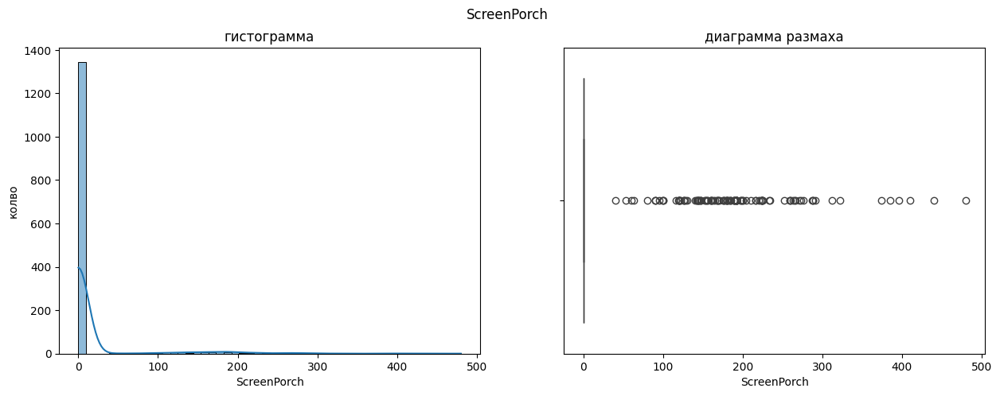

пропуски в столбце ScreenPorch : 0


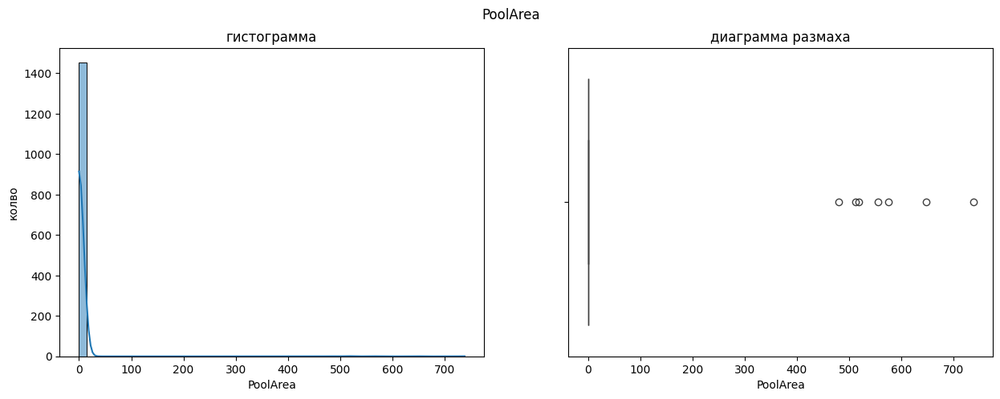

пропуски в столбце PoolArea : 0


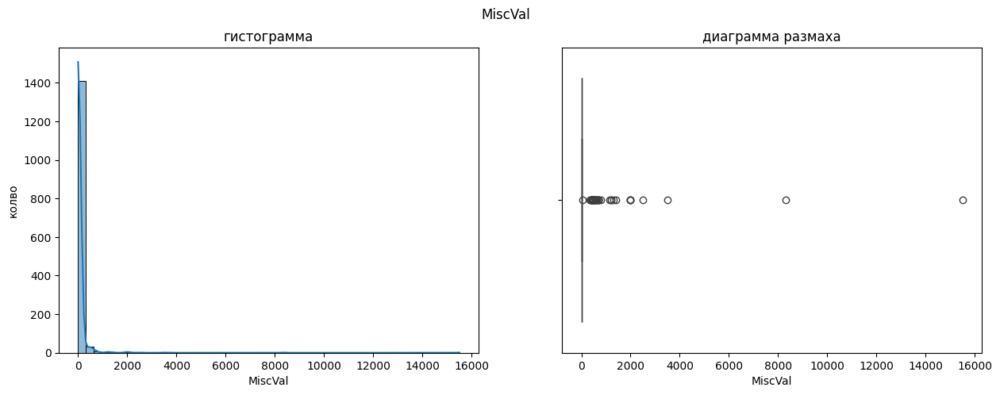

пропуски в столбце MiscVal : 0


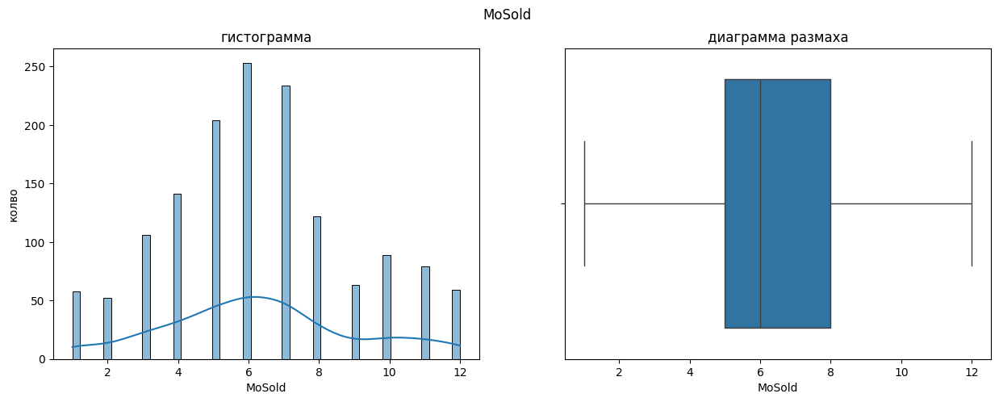

пропуски в столбце MoSold : 0


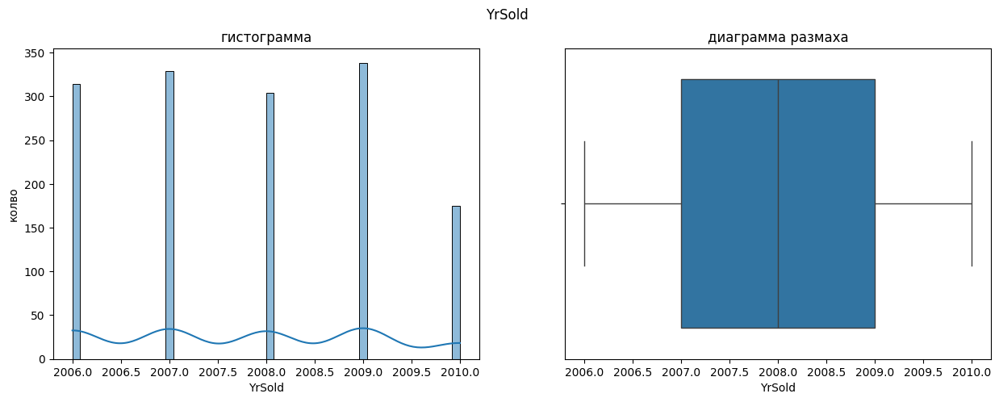

пропуски в столбце YrSold : 0


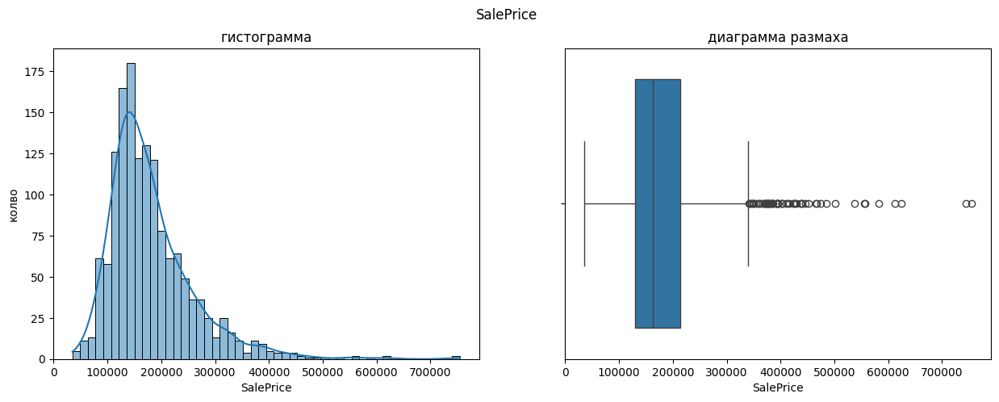

пропуски в столбце SalePrice : 0


In [41]:
for col in numeric_features:
  hist_box(train,col)
  print('пропуски в столбце',col,':',train[col].isna().sum())


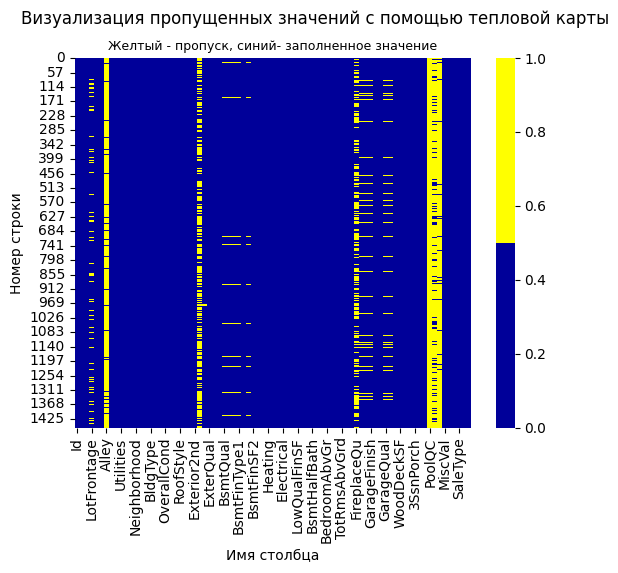

In [42]:
# визуализация пропущенных значений с помощью тепловой карты
# желтый - пропущенные данные, синий - не пропущенные
colours = ['#000099', '#ffff00']
sns.heatmap(train.isnull(), cmap=sns.color_palette(colours));
plt.suptitle('Визуализация пропущенных значений с помощью тепловой карты')
plt.title("Желтый - пропуск, синий- заполненное значение", fontsize =9);
plt.ylabel('Номер строки');
plt.xlabel('Имя столбца');

In [43]:
n = train.isnull().sum()
n[n>0].sort_values(ascending=False)

,0
PoolQC,1453
MiscFeature,1406
Alley,1369
Fence,1179
MasVnrType,872
FireplaceQu,690
LotFrontage,259
GarageType,81
GarageYrBlt,81
GarageFinish,81


In [44]:
garage = train[train['GarageType'].isna()]
garage = garage.isna().sum()
garage[garage>0]

,0
LotFrontage,7
Alley,72
MasVnrType,75
BsmtQual,7
BsmtCond,7
BsmtExposure,7
BsmtFinType1,7
BsmtFinType2,7
FireplaceQu,72
GarageType,81


в некоторых столбцах пропуски занимают почти весь столбец. Особо критичными выглядят 6 столбцов. Посмотрим и подумаем как заменить пропуски.

**PoolQC** Pool quality - качество бассейна, возможно тут сыграл роль человеческий фактор, в случае если столбец был необязательным, его просто не заполняли. заполню пропуски NA	No Pool

**MiscFeature**: Различные функции, не вошедшие в другие категории. NA	None

**Alley** Тип подъезда к переулку - здесь я добавлю заглушку - 'Other' так как всего было 3 варианта - гравий, вымощена и нет подъезда, возможно, этого мало,поэтому не заполняли данный пункт.

 **Fence** - Качество забора.Поставлю NA	No Fence

 **MasVnrType**: Тип шпона каменной кладки. Тут тоже правильным кажется поставить заглушку 'Other' .

 **FireplaceQu** Качество камина - NA	No Fireplace

 Видим, что во всех столбцах связанных с гаражом кол-во пропусков одинаковое - 81. Удалим их

In [45]:
# для пустых значений столбца рейтинг поставим значение  - default
train['PoolQC'] = train['PoolQC'].fillna('NA')

In [46]:
# для пустых значений столбца рейтинг поставим значение  - default
train['MiscFeature'] = train['MiscFeature'].fillna('NA')

In [47]:
# для пустых значений столбца поставим заглушку - другое
train['Alley'] = train['Alley'].fillna(np.nan)

In [48]:
# для пустых значений столбца рейтинг поставим значение  - default
train['Fence'] = train['Fence'].fillna('NA')

In [49]:
# для пустых значений столбца поставим заглушку - другое
train['MasVnrType'] = train['MasVnrType'].fillna(np.nan)

In [50]:
# для пустых значений столбца рейтинг поставим значение  - default
train['FireplaceQu'] = train['FireplaceQu'].fillna('NA')

In [51]:

train = train.dropna(subset = ['GarageType'])

In [52]:
n = train.isnull().sum()
n[n>0].sort_values(ascending=False)

,0
Alley,1297
MasVnrType,797
LotFrontage,252
BsmtExposure,31
BsmtFinType2,31
BsmtQual,30
BsmtCond,30
BsmtFinType1,30
MasVnrArea,8
Electrical,1


После всех преобразований осталось 252 пропуска в столбце LotFrontage. еще раз повмотрим описание и гистограмму

In [53]:
train.LotFrontage.describe().T

,LotFrontage
count,1127.000000
mean,70.683230
std,24.261598
min,21.000000
25%,60.000000
50%,70.000000
75%,80.000000
max,313.000000


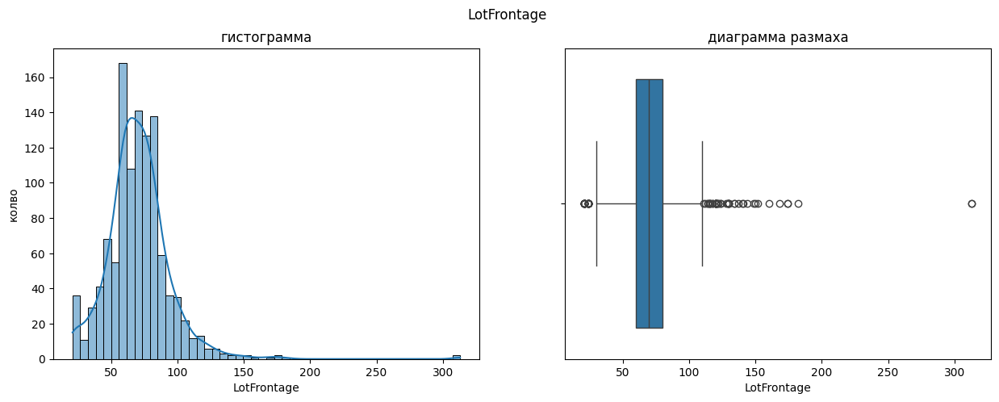

In [54]:
hist_box(train,'LotFrontage')

попробую заменить пропуски средним значееием

In [55]:
train['LotFrontage'] = train['LotFrontage'].fillna(train['LotFrontage'].mean())

In [56]:
train = train.dropna(subset = ['BsmtExposure'])


In [57]:
n = train.isnull().sum()
n[n>0].sort_values(ascending=False)

,0
Alley,1266
MasVnrType,772
MasVnrArea,8
BsmtFinType2,1
Electrical,1


In [58]:
# посмотрим значения столбца
train.Electrical.value_counts()

,count
Electrical,
SBrkr,1251
FuseA,76
FuseF,17
FuseP,2
Mix,1


In [59]:
train['Electrical'] = train['Electrical'].fillna(train.Electrical.mode)


<ipython-input-59-aecaae5cb968>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['Electrical'] = train['Electrical'].fillna(train.Electrical.mode)


In [60]:
train = train.dropna(subset = ['MasVnrArea'])
train = train.dropna(subset = ['BsmtFinType2'])

In [61]:
train.shape

(1339, 81)

In [62]:
for col in categorical_features:
  print(col)
  print(train[col].value_counts())
  print()

MSZoning
MSZoning
RL         1067
RM          191
FV           62
RH           11
C (all)       8
Name: count, dtype: int64

Street
Street
Pave    1334
Grvl       5
Name: count, dtype: int64

Alley
Alley
Grvl    43
Pave    38
Name: count, dtype: int64

LotShape
LotShape
Reg    830
IR1    459
IR2     40
IR3     10
Name: count, dtype: int64

LandContour
LandContour
Lvl    1207
Bnk      52
HLS      48
Low      32
Name: count, dtype: int64

Utilities
Utilities
AllPub    1338
NoSeWa       1
Name: count, dtype: int64

LotConfig
LotConfig
Inside     958
Corner     244
CulDSac     90
FR2         43
FR3          4
Name: count, dtype: int64

LandSlope
LandSlope
Gtl    1266
Mod      61
Sev      12
Name: count, dtype: int64

Neighborhood
Neighborhood
NAmes      209
CollgCr    146
OldTown    100
Somerst     83
Gilbert     77
NridgHt     75
NWAmes      73
Edwards     70
Sawyer      69
SawyerW     53
Crawfor     50
BrkSide     47
Mitchel     42
NoRidge     41
Timber      38
IDOTRR      29
ClearCr    

в категориальных значениях все нормально, опечаток и странных значений нет

### Тестовый набор

In [63]:
print("\n Статистика по столбцам test:")
test.describe().T


 Статистика по столбцам test:


,count,mean,std,min,25%,50%,75%,max
Id,1459.0,2190.000000,421.321334,1461.0,1825.50,2190.0,2554.50,2919.0
MSSubClass,1459.0,57.378341,42.746880,20.0,20.00,50.0,70.00,190.0
LotFrontage,1232.0,68.580357,22.376841,21.0,58.00,67.0,80.00,200.0
LotArea,1459.0,9819.161069,4955.517327,1470.0,7391.00,9399.0,11517.50,56600.0
OverallQual,1459.0,6.078821,1.436812,1.0,5.00,6.0,7.00,10.0
OverallCond,1459.0,5.553804,1.113740,1.0,5.00,5.0,6.00,9.0
YearBuilt,1459.0,1971.357779,30.390071,1879.0,1953.00,1973.0,2001.00,2010.0
YearRemodAdd,1459.0,1983.662783,21.130467,1950.0,1963.00,1992.0,2004.00,2010.0
MasVnrArea,1444.0,100.709141,177.625900,0.0,0.00,0.0,164.00,1290.0
BsmtFinSF1,1458.0,439.203704,455.268042,0.0,0.00,350.5,753.50,4010.0


In [64]:
test_numeric_features,test_categorical_features =  num_cat(test)

Числовые столбцы: Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold'],
      dtype='object')
Категориальные столбцы: Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtF

In [65]:
test_numeric_features = test_numeric_features.drop('Id')

In [66]:
for col in test_numeric_features:
  analyze_outliers(test, col)

____________________________________________________________________
интервал фактических значений для переменной MSSubClass от 20 до 190
интервал нормальных значений для переменной MSSubClass от 0 до 145.0
переменная MSSubClass содержит аномальных значений : 7.13%
____________________________________________________________________
интервал фактических значений для переменной LotFrontage от 21.0 до 200.0
интервал нормальных значений для переменной LotFrontage от nan до nan
переменная LotFrontage содержит аномальных значений : 0.0%
____________________________________________________________________
интервал фактических значений для переменной LotArea от 1470 до 56600
интервал нормальных значений для переменной LotArea от 1201.25 до 17707.25
переменная LotArea содержит аномальных значений : 4.11%
____________________________________________________________________
интервал фактических значений для переменной OverallQual от 1 до 10
интервал нормальных значений для переменной OverallQual

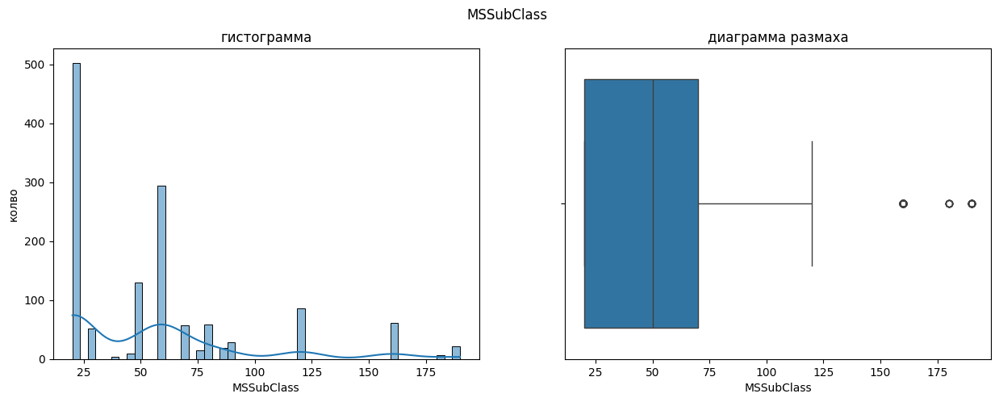

пропуски в столбце MSSubClass : 0


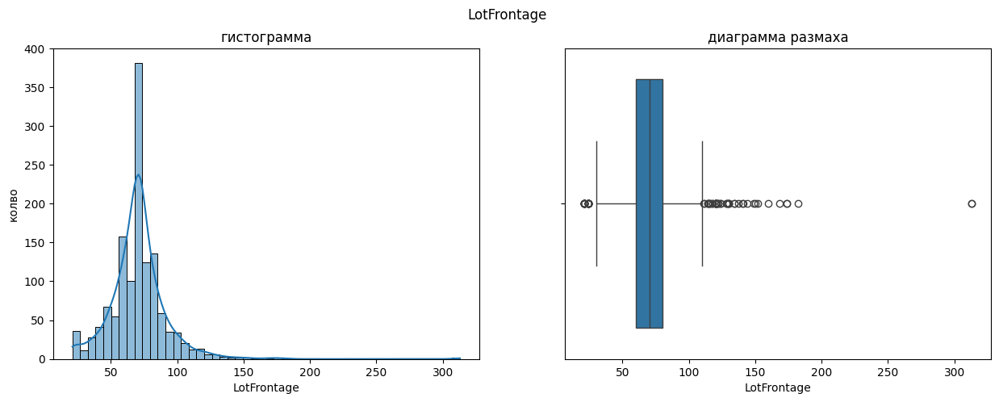

пропуски в столбце LotFrontage : 0


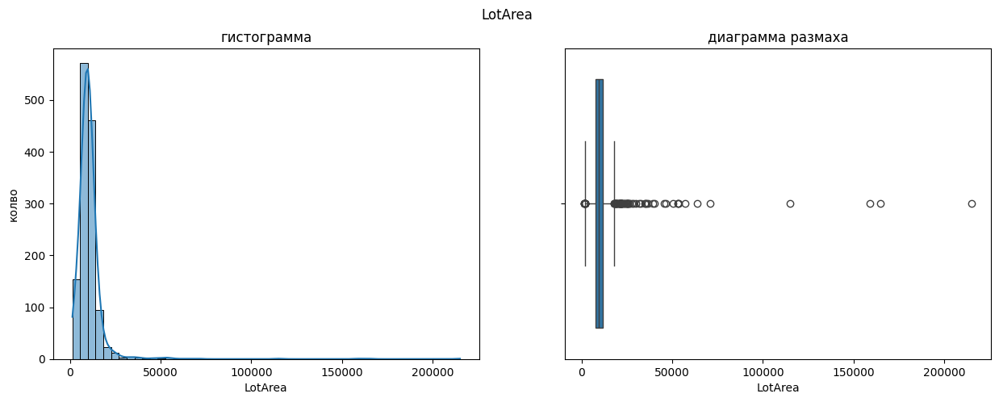

пропуски в столбце LotArea : 0


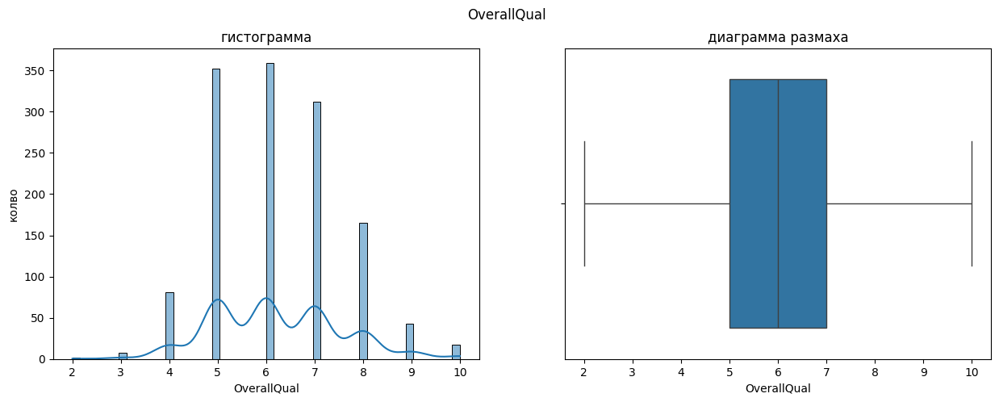

пропуски в столбце OverallQual : 0


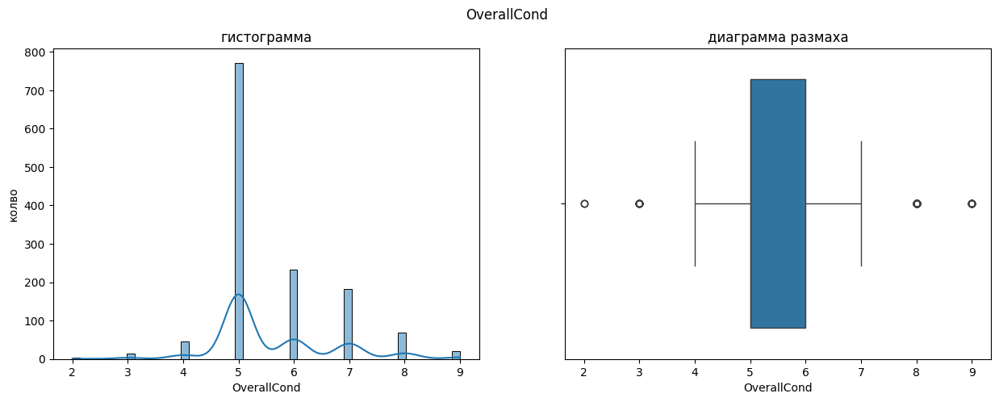

пропуски в столбце OverallCond : 0


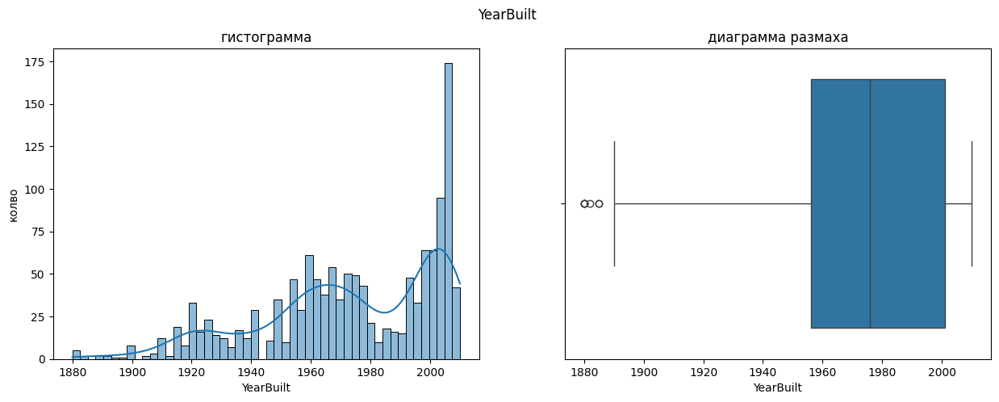

пропуски в столбце YearBuilt : 0


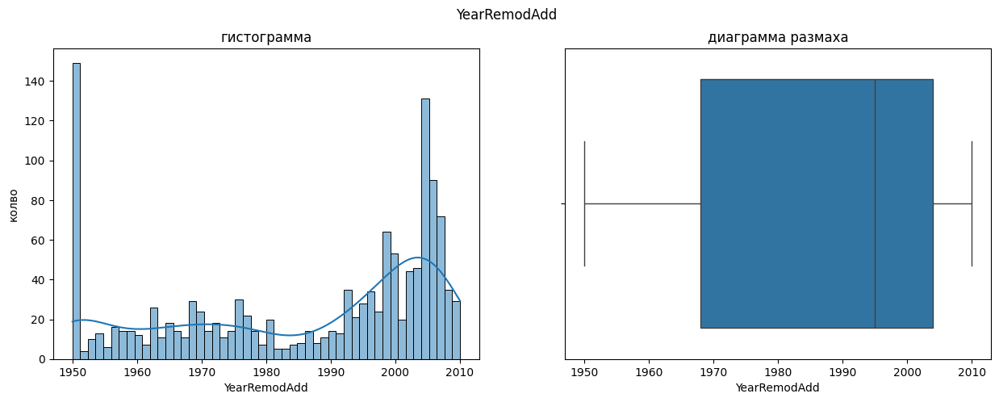

пропуски в столбце YearRemodAdd : 0


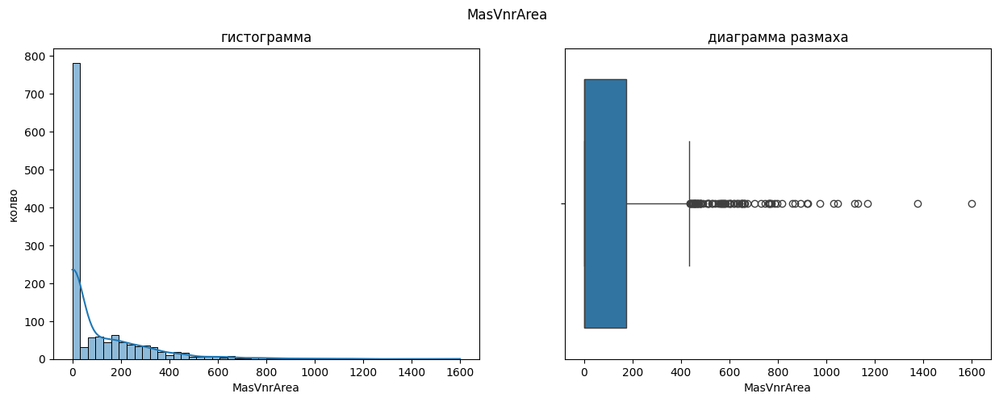

пропуски в столбце MasVnrArea : 0


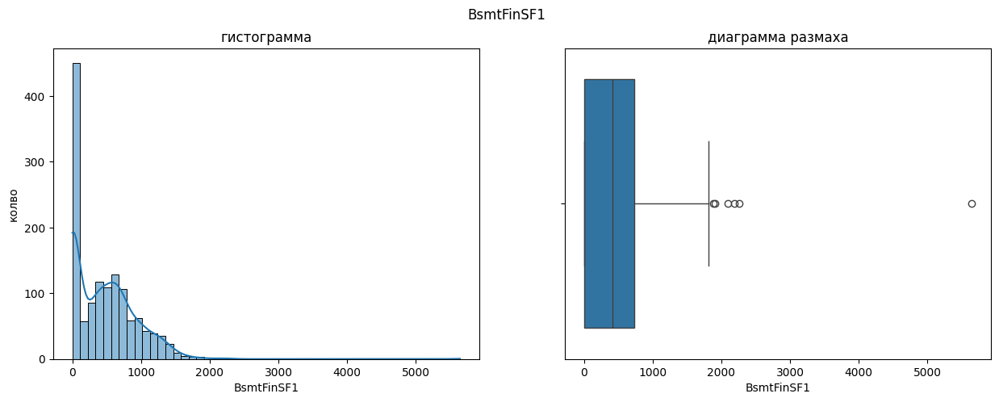

пропуски в столбце BsmtFinSF1 : 0


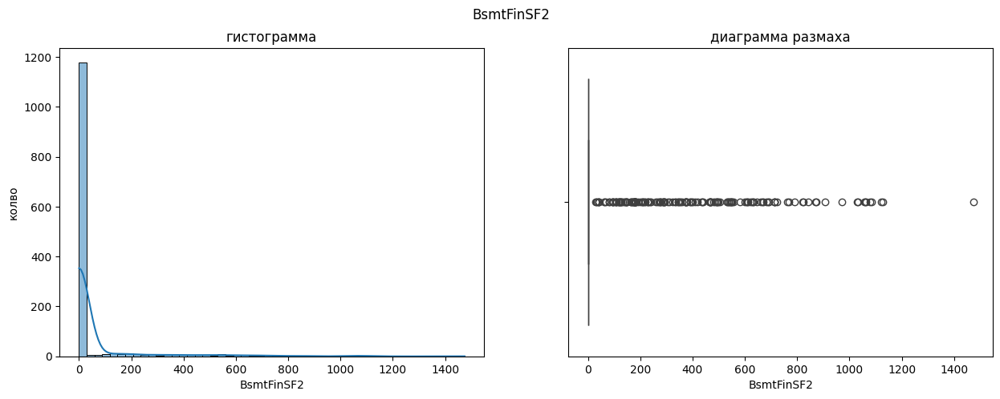

пропуски в столбце BsmtFinSF2 : 0


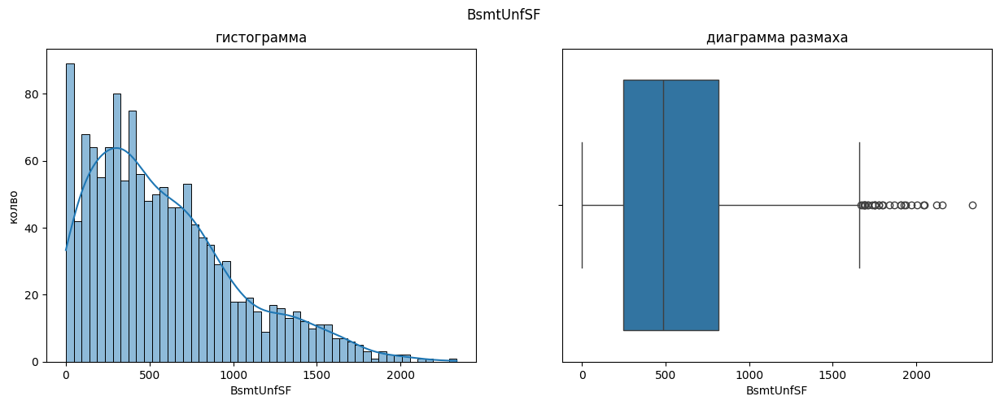

пропуски в столбце BsmtUnfSF : 0


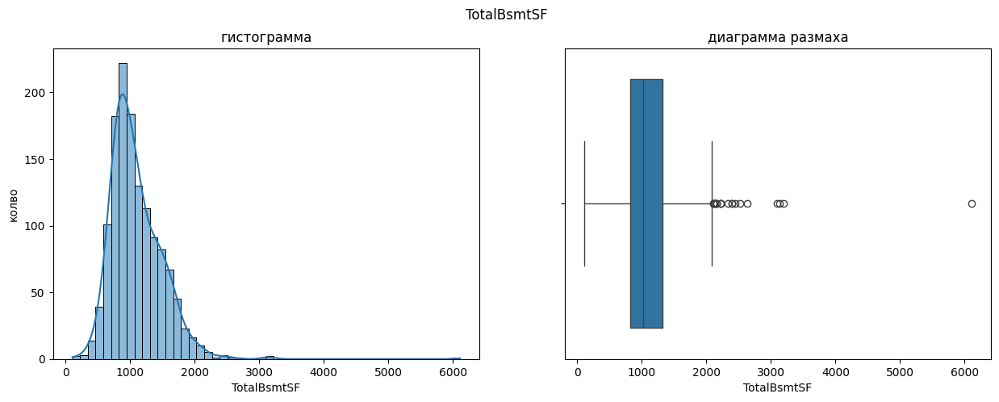

пропуски в столбце TotalBsmtSF : 0


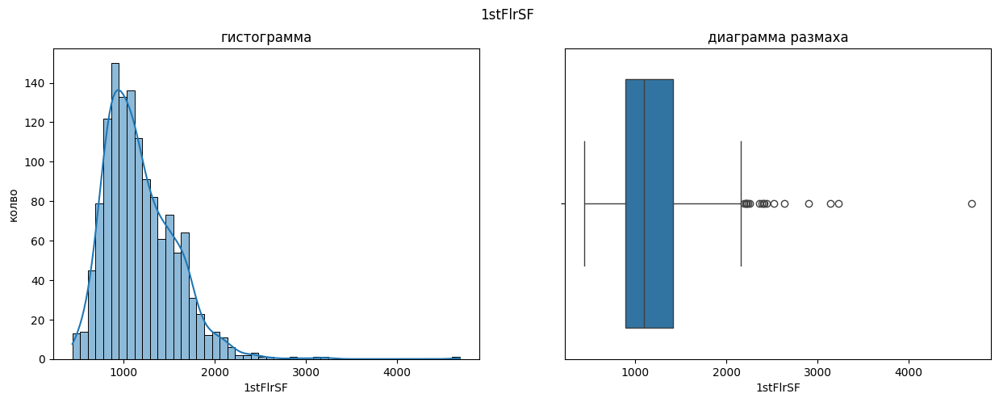

пропуски в столбце 1stFlrSF : 0


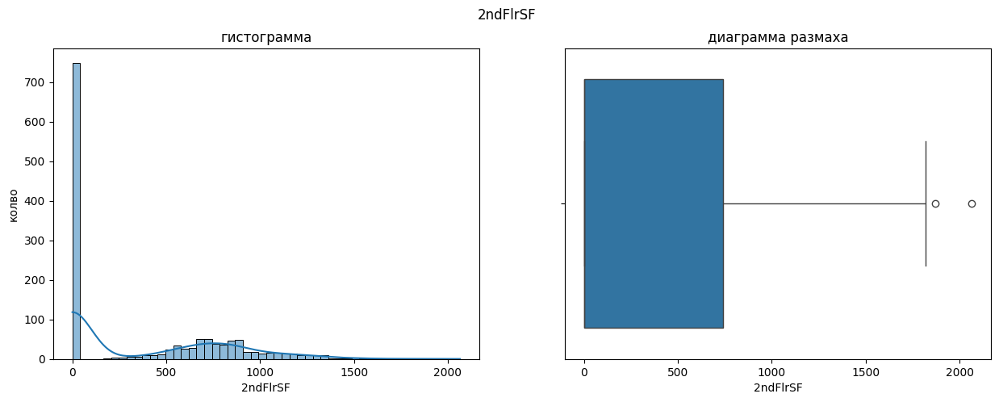

пропуски в столбце 2ndFlrSF : 0


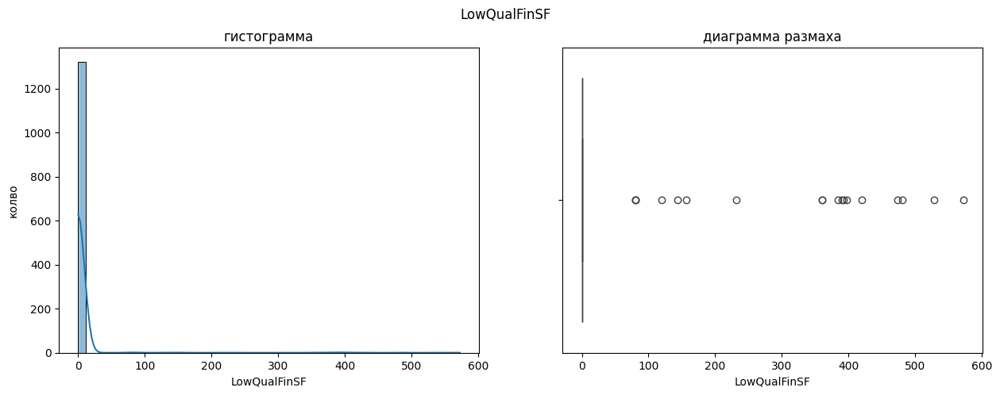

пропуски в столбце LowQualFinSF : 0


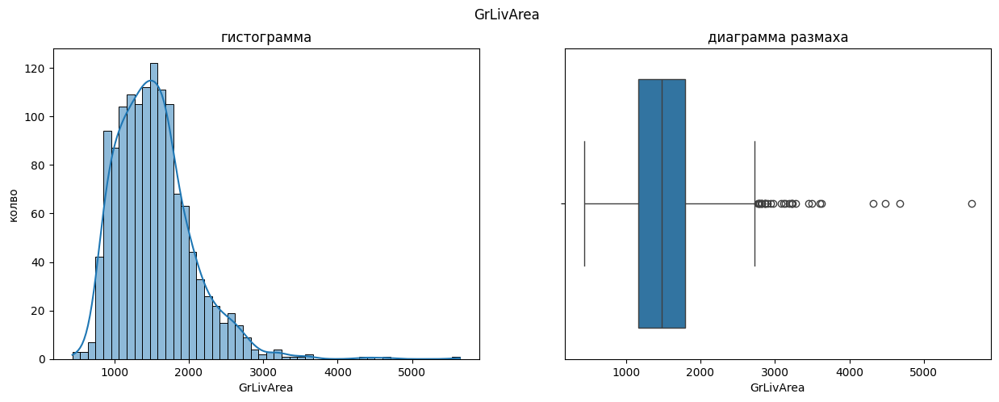

пропуски в столбце GrLivArea : 0


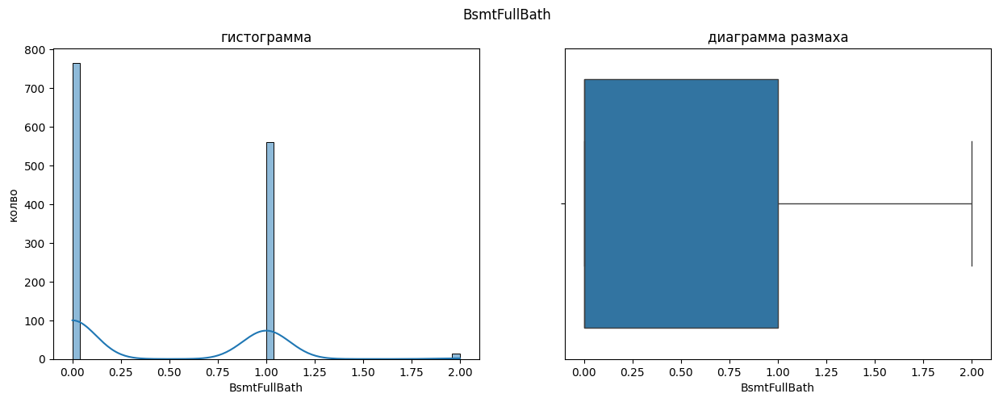

пропуски в столбце BsmtFullBath : 0


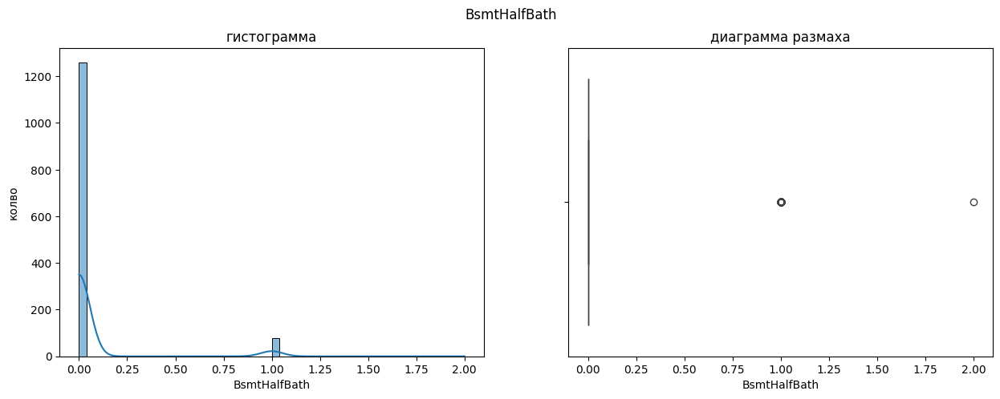

пропуски в столбце BsmtHalfBath : 0


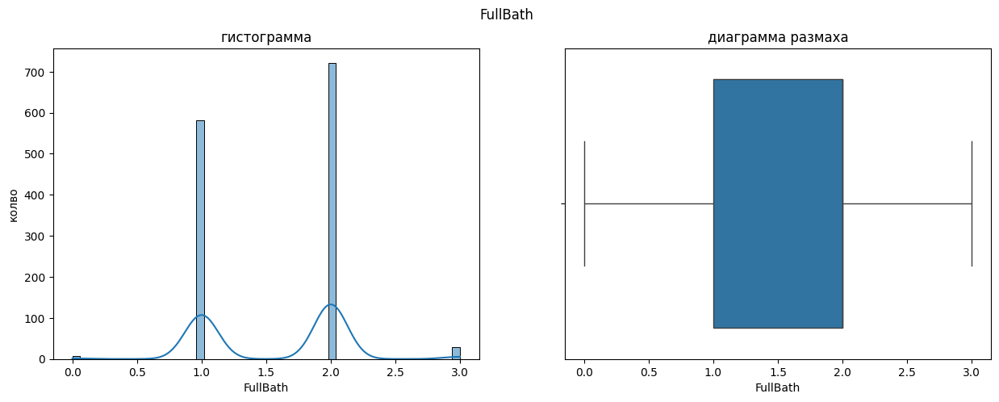

пропуски в столбце FullBath : 0


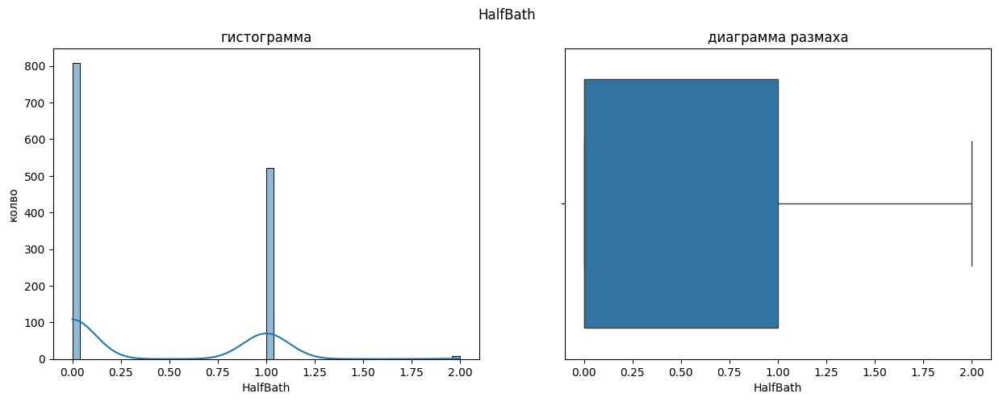

пропуски в столбце HalfBath : 0


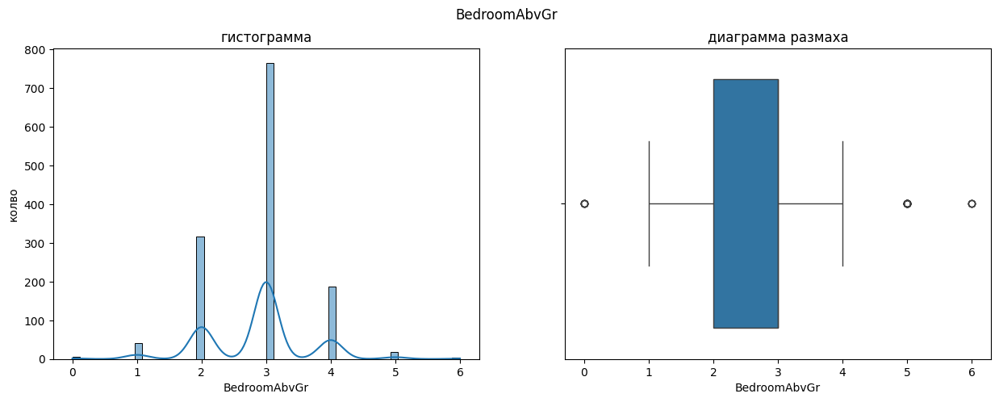

пропуски в столбце BedroomAbvGr : 0


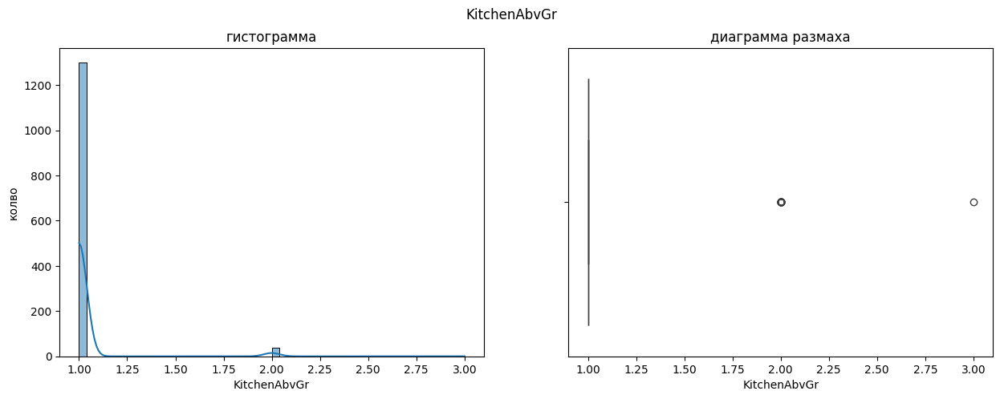

пропуски в столбце KitchenAbvGr : 0


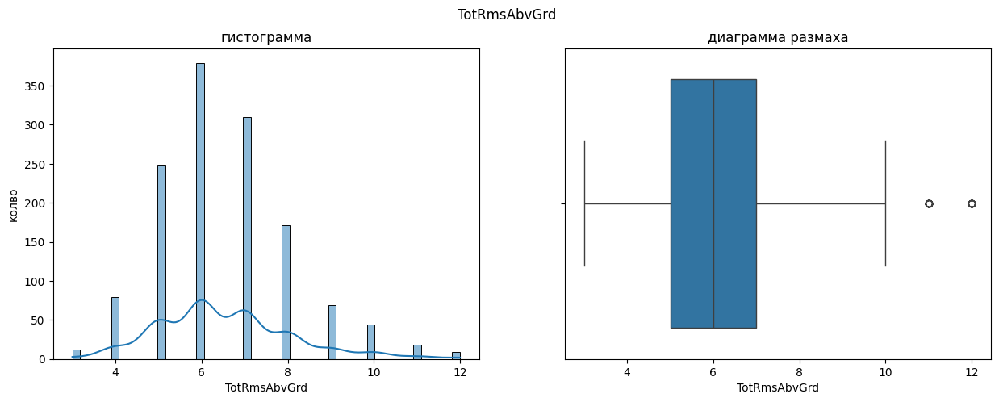

пропуски в столбце TotRmsAbvGrd : 0


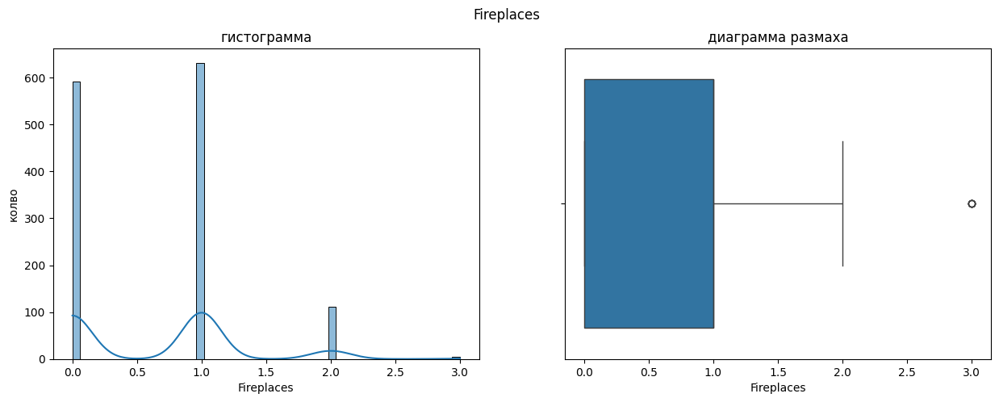

пропуски в столбце Fireplaces : 0


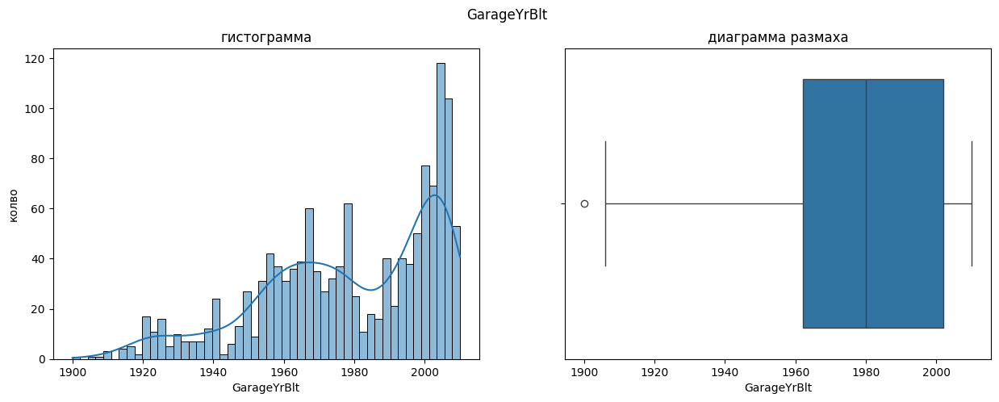

пропуски в столбце GarageYrBlt : 0


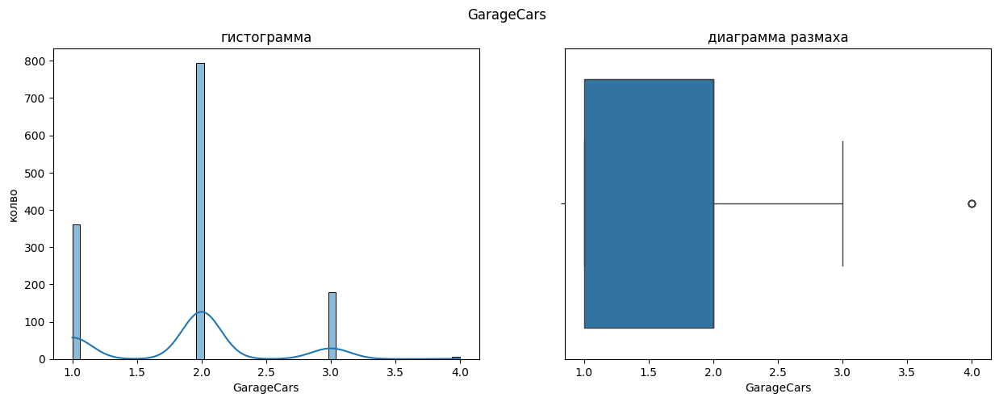

пропуски в столбце GarageCars : 0


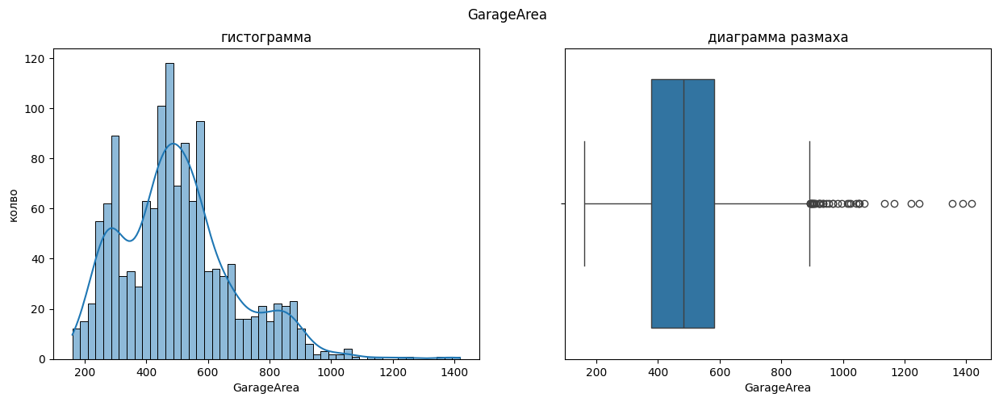

пропуски в столбце GarageArea : 0


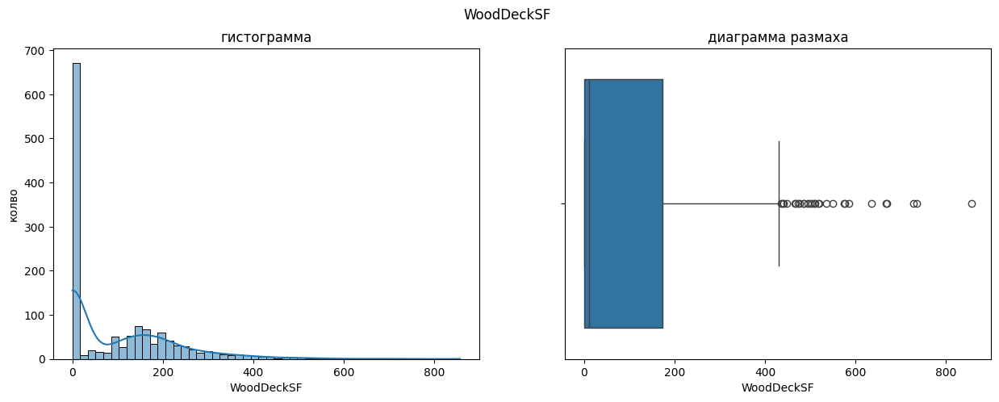

пропуски в столбце WoodDeckSF : 0


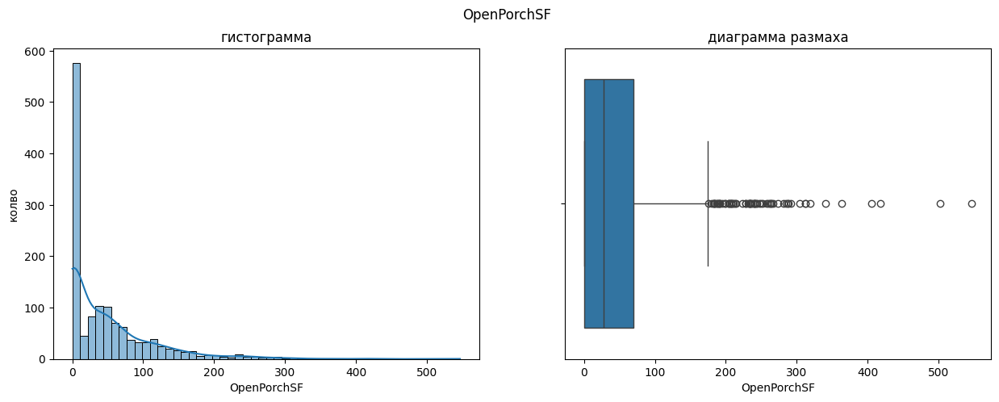

пропуски в столбце OpenPorchSF : 0


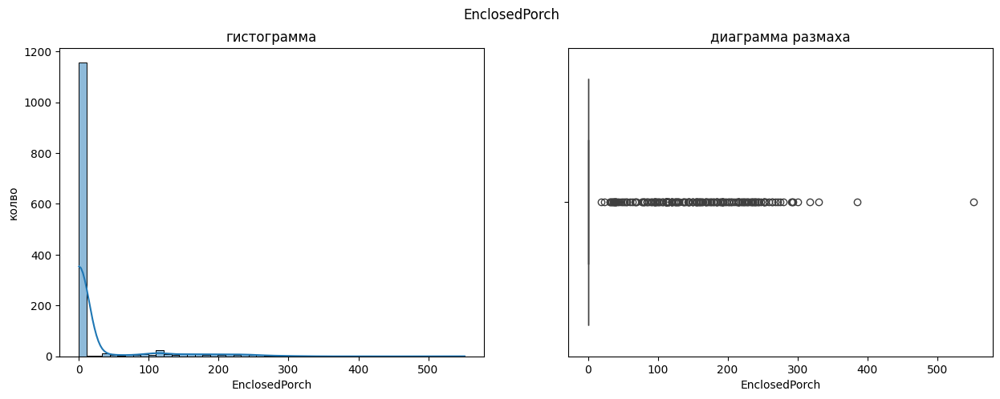

пропуски в столбце EnclosedPorch : 0


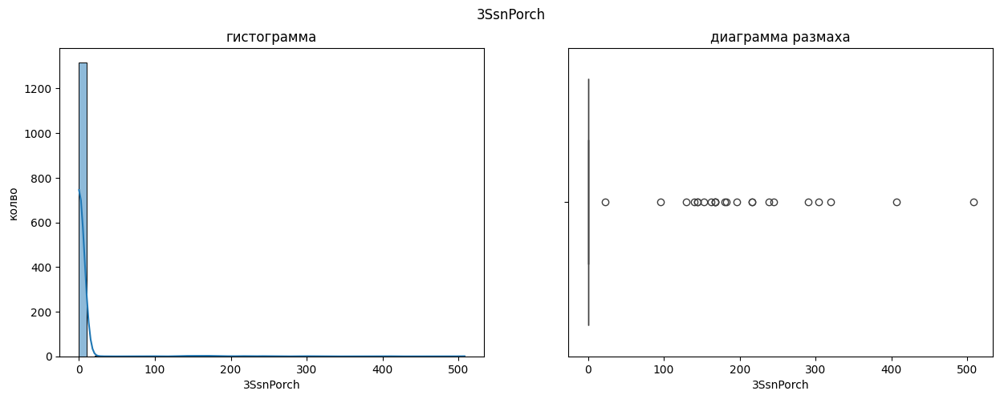

пропуски в столбце 3SsnPorch : 0


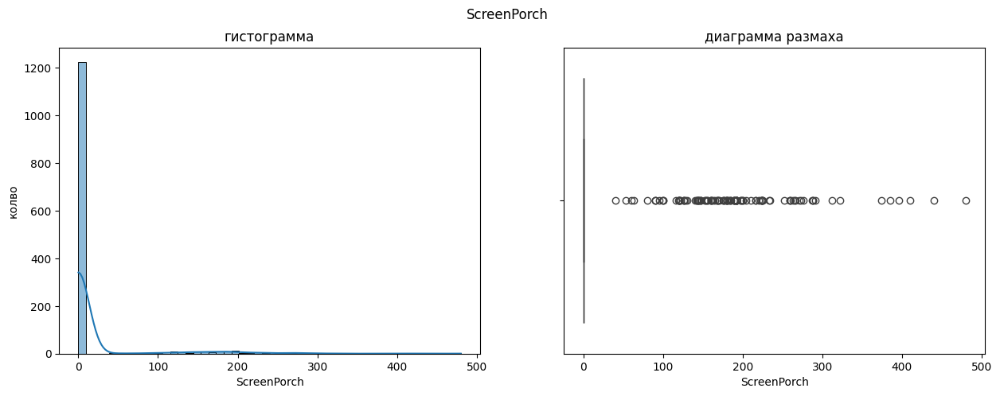

пропуски в столбце ScreenPorch : 0


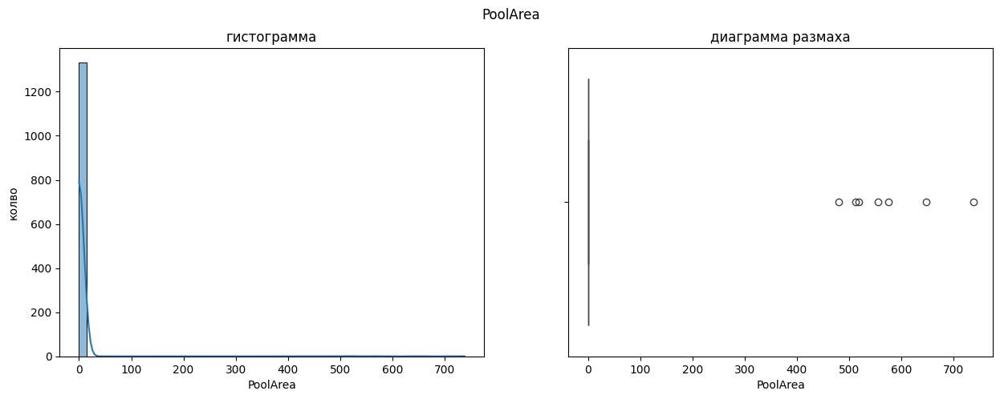

пропуски в столбце PoolArea : 0


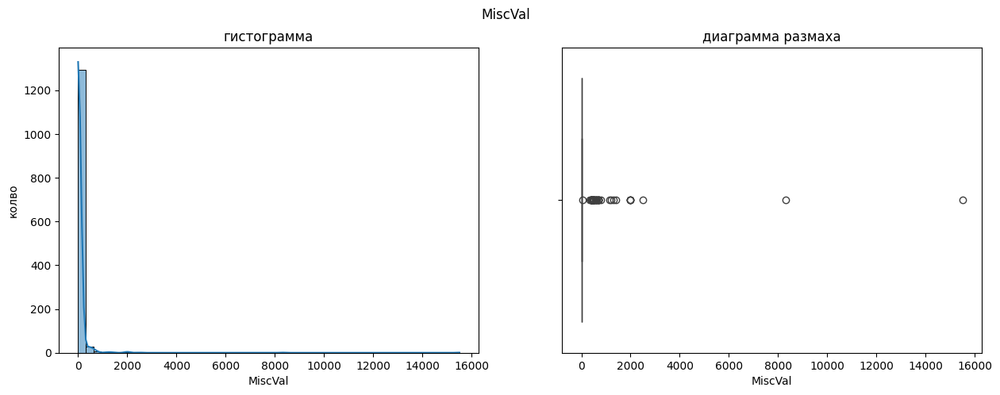

пропуски в столбце MiscVal : 0


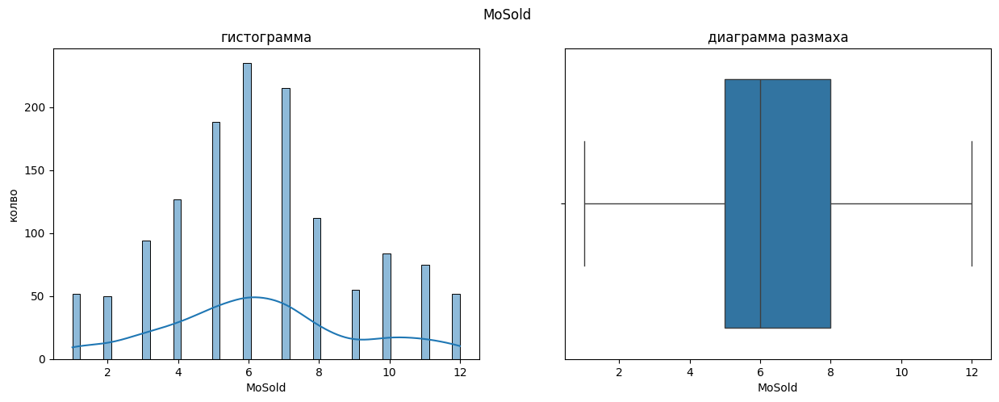

пропуски в столбце MoSold : 0


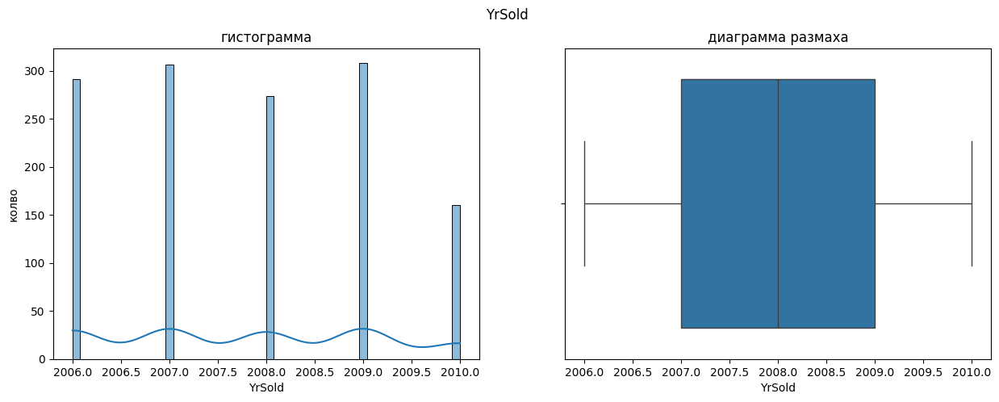

пропуски в столбце YrSold : 0


In [67]:
for col in test_numeric_features:
  hist_box(train,col)
  print('пропуски в столбце',col,':',train[col].isna().sum())

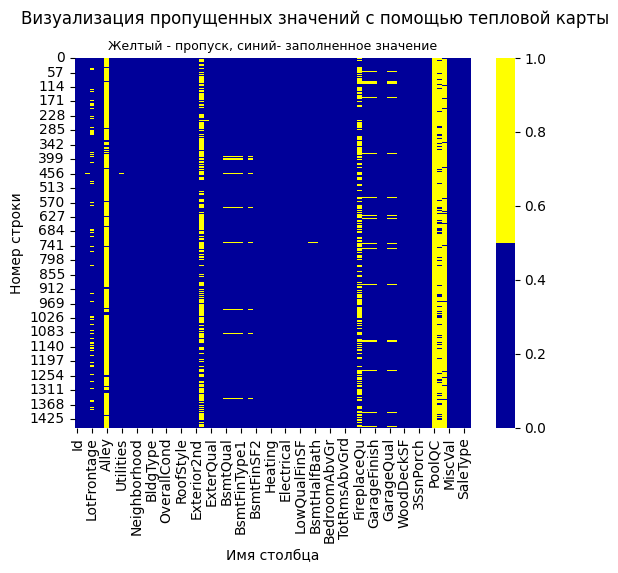

In [68]:
# визуализация пропущенных значений с помощью тепловой карты
# желтый - пропущенные данные, синий - не пропущенные
colours = ['#000099', '#ffff00']
sns.heatmap(test.isnull(), cmap=sns.color_palette(colours));
plt.suptitle('Визуализация пропущенных значений с помощью тепловой карты')
plt.title("Желтый - пропуск, синий- заполненное значение", fontsize =9);
plt.ylabel('Номер строки');
plt.xlabel('Имя столбца');

In [69]:
z = test.isnull().sum()
z[z>0].sort_values(ascending=False)

,0
PoolQC,1456
MiscFeature,1408
Alley,1352
Fence,1169
MasVnrType,894
FireplaceQu,730
LotFrontage,227
GarageCond,78
GarageYrBlt,78
GarageQual,78


пропуски почти такие же как и в тренировочном наборе.. Попробуем убрать их также как и в тренирочном.

In [70]:
# для пустых значений столбца рейтинг поставим значение  - default
test['PoolQC'] = test['PoolQC'].fillna('NA')
# для пустых значений столбца рейтинг поставим значение  - default
test['MiscFeature'] = test['MiscFeature'].fillna('NA')
# для пустых значений столбца забор поставим заглушку - другое
test['Alley'] = test['Alley'].fillna('Other')
# для пустых значений столбца поставим заглушку - другое
test['MasVnrType'] = test['MasVnrType'].fillna('Other')
test['Fence'] = test['Fence'].fillna('Other')
# для пустых значений столбца рейтинг поставим значение  - default
test['FireplaceQu'] = test['FireplaceQu'].fillna('NA')
test['LotFrontage'] = test['LotFrontage'].fillna(train['LotFrontage'].mean())
test = test.dropna(subset = ['GarageType','BsmtCond'])

In [71]:
test.shape

(1345, 80)

In [72]:
test = test.dropna()

In [73]:
test.shape

(1320, 80)

## Подготовка данных

In [74]:
# удалям ид
train = train.drop('Id', axis=1)
# посмотрим дубликаты
train.duplicated().sum()

0

In [75]:
# создание тренировочной выборки входных признаков и целевого признака
X_train = train.drop('SalePrice', axis=1)
y_train = train['SalePrice']
X_test = test.drop('Id', axis=1)


In [76]:
X_train.head(10)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,60,RL,65.00000,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,0,NA,NA,NA,0,2,2008,WD,Normal
1,20,RL,80.00000,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,0,NA,NA,NA,0,5,2007,WD,Normal
2,60,RL,68.00000,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,0,NA,NA,NA,0,9,2008,WD,Normal
3,70,RL,60.00000,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,0,NA,NA,NA,0,2,2006,WD,Abnorml
4,60,RL,84.00000,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,0,NA,NA,NA,0,12,2008,WD,Normal
5,50,RL,85.00000,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,0,NA,MnPrv,Shed,700,10,2009,WD,Normal
6,20,RL,75.00000,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,0,NA,NA,NA,0,8,2007,WD,Normal
7,60,RL,70.68323,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,0,NA,NA,Shed,350,11,2009,WD,Normal
8,50,RM,51.00000,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,0,NA,NA,NA,0,4,2008,WD,Abnorml
9,190,RL,50.00000,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,...,0,0,NA,NA,NA,0,1,2008,WD,Normal


In [77]:
interval_cols= ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold']
phik_overview = phik_matrix(X_train, interval_cols=interval_cols)
phik_overview
#phik_overview.to_excel('данные3.xlsx', index=False)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
MSSubClass,1.000000,0.406517,0.418065,0.039082,0.126003,0.694680,0.286937,0.172019,0.000000,0.100745,...,0.056688,0.027409,0.081211,0.188975,0.096642,0.188158,0.079057,0.000000,0.216749,0.210670
MSZoning,0.406517,1.000000,0.282941,0.000000,0.253283,0.606353,0.195539,0.114678,0.000000,0.166429,...,0.000000,0.000000,0.000000,0.035993,0.000000,0.000000,0.016794,0.000000,0.215285,0.185334
LotFrontage,0.418065,0.282941,1.000000,0.523083,0.110511,0.516663,0.346977,0.139347,0.000000,0.183478,...,0.000000,0.462169,0.470003,0.000000,0.000000,0.000000,0.000000,0.053386,0.011195,0.107640
LotArea,0.039082,0.000000,0.523083,1.000000,0.299430,NaN,0.376328,0.386733,0.000000,0.112213,...,0.000000,0.198370,0.183011,0.000000,0.126523,0.000000,0.000000,0.000000,0.000000,0.000000
Street,0.126003,0.253283,0.110511,0.299430,1.000000,NaN,0.061319,0.213671,0.000000,0.000000,...,0.114086,0.000000,0.000000,0.000000,0.151075,0.000000,0.055926,0.035391,0.163478,0.216243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MiscVal,0.188158,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.032712,...,0.273669,0.167870,0.423389,0.044761,0.710991,1.000000,0.015495,0.000000,0.000000,0.000000
MoSold,0.079057,0.016794,0.000000,0.000000,0.055926,0.000000,0.000000,0.126688,0.063350,0.068931,...,0.000000,0.125085,0.000000,0.056846,0.099468,0.015495,1.000000,0.349577,0.062905,0.080573
YrSold,0.000000,0.000000,0.053386,0.000000,0.035391,0.000000,0.000000,0.018517,0.000000,0.077632,...,0.000000,0.000000,0.032290,0.000000,0.085299,0.000000,0.349577,1.000000,0.151364,0.115489
SaleType,0.216749,0.215285,0.011195,0.000000,0.163478,0.207917,0.000000,0.059470,0.131326,0.000000,...,0.000000,0.000000,0.000000,0.097398,0.079550,0.000000,0.062905,0.151364,1.000000,0.733348


In [78]:
# проверим мультиколинеарность с помощью phik на тренировочных данных
#отберем непрерывные столбцы для phik

# считаем корреляции на тренировочной выборке
phik_overview = phik_matrix(X_train,interval_cols=interval_cols)
plot_correlation_matrix(
    phik_overview.values,
    x_labels=phik_overview.columns,
    y_labels=phik_overview.index,
    vmin=0, vmax=1, color_map='Greens',
    title=r'correlation $\phi_K$ тренировочная выборка',
    fontsize_factor=1.5,
    figsize=(200, 150)
)

In [79]:
X_train

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,0,NA,NA,NA,0,2,2008,WD,Normal
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,0,NA,NA,NA,0,5,2007,WD,Normal
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,0,NA,NA,NA,0,9,2008,WD,Normal
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,0,NA,NA,NA,0,2,2006,WD,Abnorml
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,0,NA,NA,NA,0,12,2008,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,0,NA,NA,NA,0,8,2007,WD,Normal
1456,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,0,NA,MnPrv,NA,0,2,2010,WD,Normal
1457,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,0,NA,GdPrv,Shed,2500,5,2010,WD,Normal
1458,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,0,NA,NA,NA,0,4,2010,WD,Normal


In [80]:
X_train = X_train.drop(['HouseStyle','BldgType','GarageFinish','GarageCond','GarageCars','Neighborhood','Exterior2nd','GrLivArea','2ndFlrSF',
                        'GarageYrBlt'], axis=1)

In [81]:
X_train = X_train.drop('LotShape', axis=1)

In [82]:
X_test = X_test.drop(['HouseStyle','BldgType','GarageFinish','GarageCond','GarageCars','Neighborhood','Exterior2nd','GrLivArea','2ndFlrSF',
                      'GarageYrBlt'], axis=1)

In [83]:
test.duplicated().sum()

0

## pipeline

In [84]:
# чтение данных
try:
  train = pd.read_csv('train.csv')
  test = pd.read_csv('test.csv')
  print('load from current folder')
except:
  train = pd.read_csv('https://raw.githubusercontent.com/OlgaShishikina/kaggle/main/Housing%20Prices%20Competition%20for%20Kaggle%20Learn%20Users/train.csv')
  test = pd.read_csv('https://raw.githubusercontent.com/OlgaShishikina/kaggle/main/Housing%20Prices%20Competition%20for%20Kaggle%20Learn%20Users/test.csv')
  print('load from github')

load from github


In [85]:
# Separate target variable and features
y = train['SalePrice']
X = train.drop(columns=['SalePrice', 'Id'])
test_ids = test['Id']
test.drop(columns=['Id'], inplace=True)

# Identify categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns

In [86]:
categorical_cols

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

In [87]:
numerical_cols

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold'],
      dtype='object')

In [88]:
cols_to_drop = ["Alley", "FireplaceQu", "PoolQC", "Fence", "MiscFeature"]
train.drop(columns=cols_to_drop, inplace=True)
test.drop(columns=cols_to_drop, inplace=True)

# Fill missing values
for df in [train, test]:
   # Numerical columns
   num_cols = df.select_dtypes(include=["float64", "int64"]).columns
   df[num_cols] = df[num_cols].fillna(df[num_cols].median())

   # Categorical columns
   cat_cols = df.select_dtypes(include=["object"]).columns
   df[cat_cols] = df[cat_cols].fillna("NA")

In [89]:
# Identify categorical and numerical columns
X.drop(columns=cols_to_drop, inplace=True)
categorical_cols = X.select_dtypes(include=['object']).columns
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns

In [90]:
categorical_cols

Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond',
       'PavedDrive', 'SaleType', 'SaleCondition'],
      dtype='object')

In [91]:
train.isna().sum()

,0
Id,0
MSSubClass,0
MSZoning,0
LotFrontage,0
LotArea,0
...,...
MoSold,0
YrSold,0
SaleType,0
SaleCondition,0


In [92]:
y = train['SalePrice']
X = train.drop(columns=['SalePrice', 'Id'])

In [93]:
# Define preprocessors
preprocessor = ColumnTransformer(
   transformers=[
       ('num', MinMaxScaler(), numerical_cols),
       ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)
   ])

In [94]:


# Split the training data
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [95]:
# проверим размеры получившихся выборок
size_train =X_train.shape[0]/X.shape[0]
size_val =y_val.shape[0]/y.shape[0]

print('Размер тренировочной выборки- {:.0%}'.format(size_train))
print('Размер тестовой выборки - {:.0%}'.format(size_val))

Размер тренировочной выборки- 80%
Размер тестовой выборки - 20%


In [96]:

X_train.isnull().sum()

,0
MSSubClass,0
MSZoning,0
LotFrontage,0
LotArea,0
Street,0
...,...
MiscVal,0
MoSold,0
YrSold,0
SaleType,0


In [97]:
X_train.isnull().values.any()

False

In [98]:
# cоздаём пайплайн для подготовки признаков из списка ord_columns: заполнение пропусков и Ordinal-кодирование
# SimpleImputer + OE
ord_pipe = Pipeline(
    [
        (
            'simpleImputer_before_ord',
            SimpleImputer(missing_values=np.nan, strategy='most_frequent')
        ),
        (
            'ord',
            OrdinalEncoder(


                handle_unknown='use_encoded_value', unknown_value=np.nan
            )
        ),
        (
            'simpleImputer_after_ord',
            SimpleImputer(missing_values=np.nan, strategy='most_frequent')
        )
    ]
)

In [99]:
# SimpleImputer + OHE
ohe_pipe = Pipeline(
    [
        (
            'imputer',
            SimpleImputer(missing_values=np.nan, strategy='most_frequent')
        ),
        (
            'ohe',
            OneHotEncoder(drop='first', handle_unknown='ignore')
        )
    ]
)

In [100]:
# создаём общий пайплайн для подготовки данных
data_preprocessor = ColumnTransformer(
    [

        ('ohe', ohe_pipe, categorical_cols),
        ('num', MinMaxScaler(), numerical_cols)
    ],
    remainder='passthrough'
)

In [101]:
# итоговый пайплайн: подготовка данных и модель
pipe_final = Pipeline(
    [
        ('preprocessor', data_preprocessor),
        ('models', DecisionTreeRegressor(random_state=12345))
    ]
)

In [102]:
# убирает выводы при обучении модели verbose=False
param_distributions = [

    {
        'models': [CatBoostRegressor(verbose=False)],
        'models__learning_rate':(0.1,0.2,0.1),
        'models__random_seed':range(10,15,10),
        'models__n_estimators':range(100,300,100)

    }

]

In [103]:
categorical_cols

Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond',
       'PavedDrive', 'SaleType', 'SaleCondition'],
      dtype='object')

In [104]:
grid = GridSearchCV(
    pipe_final,
    param_grid=param_distributions,
    cv=3,
    scoring='neg_mean_absolute_error',
    n_jobs = -1
)
grid.fit(X_train, y_train)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('ohe',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='most_frequent')),
                                                                                         ('ohe',
                                                                                          OneHotEncoder(drop='first',
                                                                                                        handle_unknown='ignore'))]),
                                                                         Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighbor...
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold'],
      dtype='object'))])),
                                       ('models',
                                        DecisionTreeRegressor(random_state=12345))]),
             n_jobs=-1,
             param_grid=[{'models': [<catboost.core.CatBoostRegressor object at 0x7e20b7f1c0d0>],
                          'models__learning_rate': (0.1, 0.2, 0.1),
                          'models__n_estimators': range(100, 300, 100),
                          'models__random_seed': range(10, 15, 10)}],
             scoring='neg_mean_absolute_error')

In [105]:
df_cv_results = pd.DataFrame(grid.cv_results_)

## числовые признаки через минмакс скалер, потом one hot

In [106]:

print('Лучшая модель и её параметры:\n\n', grid.best_estimator_)
print ('Метрика лучшей модели на тренировочной выборке:', grid.best_score_)

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Conditio...
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'Gara

### **Метрика лучшей модели на тренировочной выборке: -15841.52094207096**

In [107]:
model = grid.best_estimator_
y_pred = model.predict(test)

/usr/local/lib/python3.11/dist-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0, 4, 14, 15, 29, 30, 36] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


In [108]:
predictions = pd.DataFrame()

In [109]:
predictions['Id'] = test_ids

In [110]:
predictions['SalePrice'] = y_pred

In [111]:
predictions.shape

(1459, 2)

In [112]:
predictions.to_csv('cb3_label.csv',index=False)

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Conditio...
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold'],
      dtype='object'))])),
                ('models',
                 RandomForestRegressor(max_depth=20, random_state=91224))])
Метрика лучшей модели на тренировочной выборке: -18083.21135671974

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Conditio...
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold'],
      dtype='object'))])),
                ('models', LGBMRegressor(random_state=91224))])
Метрика лучшей модели на тренировочной выборке: -17228.268601071246

In [113]:
from scipy.stats import randint
param_distributions = [

    {
        'models': [CatBoostRegressor()],
        'models__learning_rate':(0.1,1,0.1),
        'models__random_seed':range(10,25,10)

    },
     {
       'models': [LGBMRegressor(random_state=RANDOM_STATE)],
       'models__learning_rate':(0.1,1,0.1),
       'models__max_depth': range(2, 6, 2),
       'models__n_estimators':range(100,550,100)

     }

]

 {
        'models': [SGDRegressor()],
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']
     }

In [114]:
pipe_final

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Conditio...
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold'],
      dtype='object'))])),
                ('models', DecisionTreeRegressor(random_state=12345))])

*Курсив*# Новый раздел

In [115]:
y_train.isna().sum()


0

## standart

In [116]:
# создаём общий пайплайн для подготовки данных
data_preprocessor = ColumnTransformer(
    [

        ('ohe', ohe_pipe, categorical_cols),
        ('num', StandardScaler(), numerical_cols)
    ],
    remainder='passthrough'
)

In [117]:
# итоговый пайплайн: подготовка данных и модель
pipe_final = Pipeline(
    [
        ('preprocessor', data_preprocessor),
        ('models', DecisionTreeRegressor(random_state=12345))
    ]
)

In [118]:
# убирает выводы при обучении модели verbose=False
param_distributions = [

    {
        'models': [CatBoostRegressor(task_type="GPU",verbose=False)],
        'models__learning_rate':(0.1,1,0.1),
        'models__n_estimators':range(100,600,100)

    }

]

In [120]:
grid = GridSearchCV(
    pipe_final,
    param_grid=param_distributions,
    cv=3,
    scoring='neg_mean_absolute_error',
    n_jobs = -1
)
grid.fit(X_train, y_train)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('ohe',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='most_frequent')),
                                                                                         ('ohe',
                                                                                          OneHotEncoder(drop='first',
                                                                                                        handle_unknown='ignore'))]),
                                                                         Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighbor...
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold'],
      dtype='object'))])),
                                       ('models',
                                        DecisionTreeRegressor(random_state=12345))]),
             n_jobs=-1,
             param_grid=[{'models': [<catboost.core.CatBoostRegressor object at 0x7e20b6bee850>],
                          'models__learning_rate': (0.1, 1, 0.1),
                          'models__n_estimators': range(100, 600, 100)}],
             scoring='neg_mean_absolute_error')

In [121]:

print('Лучшая модель и её параметры:\n\n', grid.best_estimator_)
print ('Метрика лучшей модели на тренировочной выборке:', grid.best_score_)

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Conditio...
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'Gara

### **Метрика лучшей модели на тренировочной выборке: -15595.169992891737**

{'models': <catboost.core.CatBoostRegressor at 0x7e20b6bee850>,

 'models__learning_rate': 0.1,

 'models__n_estimators': 400}

 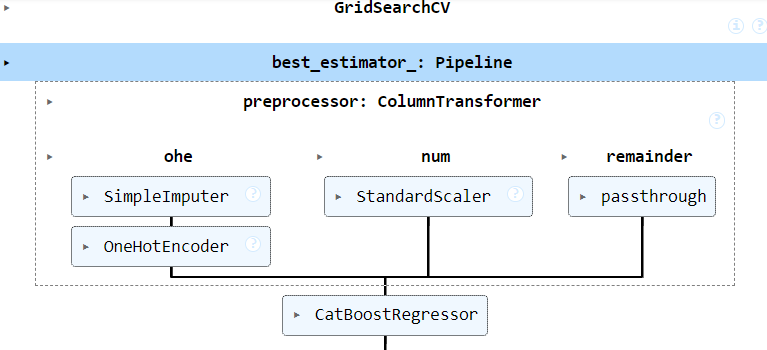

In [122]:
grid.best_params_

{'models': <catboost.core.CatBoostRegressor at 0x7e20b6bee850>,
 'models__learning_rate': 0.1,
 'models__n_estimators': 400}

In [ ]:
model = grid.best_estimator_
y_pred = model.predict(test)

In [ ]:
predictions = pd.DataFrame()

In [ ]:
predictions['Id'] = test_ids

In [ ]:
predictions['SalePrice'] = y_pred

In [ ]:
predictions.shape

In [ ]:
predictions.to_csv('cb4_stdscaler.csv',index=False)

## удаляю признаки мультиколинеарнсоть

In [123]:
cols_to_drop = ['HouseStyle','BldgType','GarageFinish','GarageCond','GarageCars','Neighborhood','Exterior2nd','GrLivArea','2ndFlrSF','GarageYrBlt']
X_train.drop(columns=cols_to_drop, inplace=True)

In [124]:
X_train.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Condition1', 'Condition2', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', 'LowQualFinSF',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional',
       'Fireplaces', 'GarageType', 'GarageArea', 'GarageQual', 'PavedDrive',
       'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SaleType',
       'SaleCondition'],
      dtype='object')

In [125]:
X_train.isnull().values.any()

False

In [126]:
categorical_cols = X_train.select_dtypes(include=['object']).columns
numerical_cols = X_train.select_dtypes(include=['float64', 'int64']).columns

In [127]:
# создаём общий пайплайн для подготовки данных
data_preprocessor = ColumnTransformer(
    [

        ('ohe', ohe_pipe, categorical_cols),
        ('num', StandardScaler(), numerical_cols)
    ],
    remainder='passthrough'
)

In [128]:
# итоговый пайплайн: подготовка данных и модель
pipe_final = Pipeline(
    [
        ('preprocessor', data_preprocessor),
        ('models', DecisionTreeRegressor(random_state=12345))
    ]
)

In [129]:
# убирает выводы при обучении модели verbose=False
param_distributions = [

    {
        'models': [CatBoostRegressor(task_type="GPU",verbose=False)],
        'models__learning_rate':(0.1,1,0.1),
        'models__n_estimators':range(100,600,100)

    }

]

In [130]:
grid = GridSearchCV(
    pipe_final,
    param_grid=param_distributions,
    cv=3,
    scoring='neg_mean_absolute_error',
    n_jobs = -1
)
grid.fit(X_train, y_train)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('ohe',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='most_frequent')),
                                                                                         ('ohe',
                                                                                          OneHotEncoder(drop='first',
                                                                                                        handle_unknown='ignore'))]),
                                                                         Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Conditio...
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold'],
      dtype='object'))])),
                                       ('models',
                                        DecisionTreeRegressor(random_state=12345))]),
             n_jobs=-1,
             param_grid=[{'models': [<catboost.core.CatBoostRegressor object at 0x7e20b7b9bf50>],
                          'models__learning_rate': (0.1, 1, 0.1),
                          'models__n_estimators': range(100, 600, 100)}],
             scoring='neg_mean_absolute_error')

In [131]:

print('Лучшая модель и её параметры:\n\n', grid.best_estimator_)
print ('Метрика лучшей модели на тренировочной выборке:', grid.best_score_)

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Condition1', 'Condition2', 'RoofStyle'...
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', 'LowQualFinSF', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',

### **Метрика лучшей модели на тренировочной выборке: -17578.268796668763**

'models__learning_rate': 0.1,

 'models__n_estimators': 300}

In [132]:
grid.best_params_

{'models': <catboost.core.CatBoostRegressor at 0x7e20b7b9bf50>,
 'models__learning_rate': 0.1,
 'models__n_estimators': 300}

In [133]:
# determine the mutual information for numerical features
#You need to fillna to get results from mutual_info_regression function
#feature engineering
from sklearn.feature_selection import mutual_info_regression
mutual_df = train[numerical_cols]

mutual_info = mutual_info_regression(mutual_df.fillna(0), y, random_state=1)

mutual_info = pd.Series(mutual_info)
mutual_info.index = mutual_df.columns
pd.DataFrame(mutual_info.sort_values(ascending=False), columns = ["Numerical_Feature_MI"] ).style.background_gradient("cool")

,Numerical_Feature_MI
OverallQual,0.571604
YearBuilt,0.376197
TotalBsmtSF,0.368527
GarageArea,0.363068
1stFlrSF,0.310177
MSSubClass,0.275153
FullBath,0.267736
YearRemodAdd,0.252164
LotFrontage,0.226250
TotRmsAbvGrd,0.214396


In [134]:


mutual_df_categorical = train[categorical_cols]
#categorical features must be encoded to get mutual information
for colname in mutual_df_categorical:
    mutual_df_categorical[colname], _ = mutual_df_categorical[colname].factorize()
mutual_info = mutual_info_regression(mutual_df_categorical.fillna("Do_not_have_feature"), y, random_state=1)

mutual_info = pd.Series(mutual_info)
mutual_info.index = mutual_df_categorical.columns
pd.DataFrame(mutual_info.sort_values(ascending=False), columns = ["Categorical_Feature_MI"] ).style.background_gradient("cool")

<ipython-input-134-21d315c08a5a>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mutual_df_categorical[colname], _ = mutual_df_categorical[colname].factorize()
<ipython-input-134-21d315c08a5a>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mutual_df_categorical[colname], _ = mutual_df_categorical[colname].factorize()
<ipython-input-134-21d315c08a5a>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See t

,Categorical_Feature_MI
BsmtQual,0.327459
KitchenQual,0.324151
ExterQual,0.322703
Foundation,0.203407
GarageType,0.196756
HeatingQC,0.165860
BsmtFinType1,0.155118
Exterior1st,0.137038
MSZoning,0.120639
LotShape,0.085370


# пробую делать что-то с признаками

In [263]:
# чтение данных
try:
  train = pd.read_csv('train.csv')
  test = pd.read_csv('test.csv')
  print('load from current folder')
except:
  train = pd.read_csv('https://raw.githubusercontent.com/OlgaShishikina/kaggle/main/Housing%20Prices%20Competition%20for%20Kaggle%20Learn%20Users/train.csv')
  test = pd.read_csv('https://raw.githubusercontent.com/OlgaShishikina/kaggle/main/Housing%20Prices%20Competition%20for%20Kaggle%20Learn%20Users/test.csv')
  print('load from github')

load from github


In [149]:
# Separate target variable and features
y = train['SalePrice']
X = train.drop(columns=['SalePrice', 'Id'])
test_ids = test['Id']
test.drop(columns=['Id'], inplace=True)

# Identify categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns

In [150]:
cols_to_drop = ["Alley", "FireplaceQu", "PoolQC", "Fence", "MiscFeature"]
train.drop(columns=cols_to_drop, inplace=True)
test.drop(columns=cols_to_drop, inplace=True)

# Fill missing values
for df in [train, test]:
   # Numerical columns
   num_cols = df.select_dtypes(include=["float64", "int64"]).columns
   df[num_cols] = df[num_cols].fillna(df[num_cols].median())

   # Categorical columns
   cat_cols = df.select_dtypes(include=["object"]).columns
   df[cat_cols] = df[cat_cols].fillna("NA")

In [151]:
# Identify categorical and numerical columns
X.drop(columns=cols_to_drop, inplace=True)
categorical_cols = X.select_dtypes(include=['object']).columns
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns

In [152]:
y = train['SalePrice']
X = train.drop(columns=['SalePrice', 'Id'])

In [153]:


# Split the training data
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [155]:
test

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,20,RH,80.0,11622,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,120,0,0,6,2010,WD,Normal
1,20,RL,81.0,14267,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,36,0,0,0,0,12500,6,2010,WD,Normal
2,60,RL,74.0,13830,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,34,0,0,0,0,0,3,2010,WD,Normal
3,60,RL,78.0,9978,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,36,0,0,0,0,0,6,2010,WD,Normal
4,120,RL,43.0,5005,Pave,IR1,HLS,AllPub,Inside,Gtl,...,82,0,0,144,0,0,1,2010,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,160,RM,21.0,1936,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,0,6,2006,WD,Normal
1455,160,RM,21.0,1894,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,24,0,0,0,0,0,4,2006,WD,Abnorml
1456,20,RL,160.0,20000,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,0,9,2006,WD,Abnorml
1457,85,RL,62.0,10441,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,32,0,0,0,0,700,7,2006,WD,Normal


In [157]:

X_train['Exterior'] = X_train['Exterior1st']+X_train['Exterior2nd']
X_train = X_train.drop(columns=['Exterior2nd', 'Exterior1st'])

KeyError: 'Exterior1st'

In [158]:
test['Exterior'] = test['Exterior1st']+test['Exterior2nd']
test = test.drop(columns=['Exterior2nd', 'Exterior1st'])

In [159]:
X_train['Condition'] = X_train['Condition1']+X_train['Condition2']
X_train = X_train.drop(columns=['Condition1', 'Condition2'])

In [160]:
test['Condition'] = test['Condition1']+test['Condition2']
test = test.drop(columns=['Condition1', 'Condition2'])

In [161]:
X_train.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea',

In [162]:
categorical_cols = X_train.select_dtypes(include=['object']).columns
numerical_cols = X_train.select_dtypes(include=['float64', 'int64']).columns

In [163]:
# создаём общий пайплайн для подготовки данных
data_preprocessor = ColumnTransformer(
    [

        ('ohe', ohe_pipe, categorical_cols),
        ('num', StandardScaler(), numerical_cols)
    ],
    remainder='passthrough'
)

In [164]:
# итоговый пайплайн: подготовка данных и модель
pipe_final = Pipeline(
    [
        ('preprocessor', data_preprocessor),
        ('models', DecisionTreeRegressor(random_state=12345))
    ]
)

In [165]:
# убирает выводы при обучении модели verbose=False
param_distributions = [

    {
        'models': [CatBoostRegressor(task_type="GPU",verbose=False)],
        'models__learning_rate':(0.1,1,0.1),
        'models__n_estimators':range(100,600,100)

    }

]

In [166]:
grid = GridSearchCV(
    pipe_final,
    param_grid=param_distributions,
    cv=3,
    scoring='neg_mean_absolute_error',
    n_jobs = -1
)
grid.fit(X_train, y_train)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('ohe',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='most_frequent')),
                                                                                         ('ohe',
                                                                                          OneHotEncoder(drop='first',
                                                                                                        handle_unknown='ignore'))]),
                                                                         Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighbor...
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold'],
      dtype='object'))])),
                                       ('models',
                                        DecisionTreeRegressor(random_state=12345))]),
             n_jobs=-1,
             param_grid=[{'models': [<catboost.core.CatBoostRegressor object at 0x7e20b7f37b50>],
                          'models__learning_rate': (0.1, 1, 0.1),
                          'models__n_estimators': range(100, 600, 100)}],
             scoring='neg_mean_absolute_error')

In [167]:

print('Лучшая модель и её параметры:\n\n', grid.best_estimator_)
print ('Метрика лучшей модели на тренировочной выборке:', grid.best_score_)

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'BldgType', 'HouseStyle...
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'Gara

### **Метрика лучшей модели на тренировочной выборке: -15192.459996671736**

 'models__learning_rate': 0.1,
 'models__n_estimators': 400}

In [168]:
grid.best_params_

{'models': <catboost.core.CatBoostRegressor at 0x7e20b7f37b50>,
 'models__learning_rate': 0.1,
 'models__n_estimators': 400}

In [ ]:
model = grid.best_estimator_
y_pred = model.predict(test)

In [ ]:
predictions = pd.DataFrame()

In [ ]:
predictions['Id'] = test_ids

In [ ]:
predictions['SalePrice'] = y_pred

In [ ]:
predictions.shape

In [ ]:
predictions.to_csv('cb5_featuresnew.csv',index=False)

# Еще поработаем над признаками

In [171]:
# чтение данных
try:
  train = pd.read_csv('train.csv')
  test = pd.read_csv('test.csv')
  print('load from current folder')
except:
  train = pd.read_csv('https://raw.githubusercontent.com/OlgaShishikina/kaggle/main/Housing%20Prices%20Competition%20for%20Kaggle%20Learn%20Users/train.csv')
  test = pd.read_csv('https://raw.githubusercontent.com/OlgaShishikina/kaggle/main/Housing%20Prices%20Competition%20for%20Kaggle%20Learn%20Users/test.csv')
  print('load from github')

load from github


In [172]:
# Separate target variable and features
y = train['SalePrice']
X = train.drop(columns=['SalePrice', 'Id'])
test_ids = test['Id']
test.drop(columns=['Id'], inplace=True)

# Identify categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns

In [173]:
cols_to_drop = ["Alley", "FireplaceQu", "PoolQC", "Fence", "MiscFeature"]
train.drop(columns=cols_to_drop, inplace=True)
test.drop(columns=cols_to_drop, inplace=True)

# Fill missing values
for df in [train, test]:
   # Numerical columns
   num_cols = df.select_dtypes(include=["float64", "int64"]).columns
   df[num_cols] = df[num_cols].fillna(df[num_cols].median())

   # Categorical columns
   cat_cols = df.select_dtypes(include=["object"]).columns
   df[cat_cols] = df[cat_cols].fillna("NA")

In [174]:
# Identify categorical and numerical columns
X.drop(columns=cols_to_drop, inplace=True)
categorical_cols = X.select_dtypes(include=['object']).columns
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns

In [175]:
y = train['SalePrice']
X = train.drop(columns=['SalePrice', 'Id'])

In [176]:


# Split the training data
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [177]:
X_train['Exterior'] = X_train['Exterior1st']+X_train['Exterior2nd']
X_train = X_train.drop(columns=['Exterior2nd', 'Exterior1st'])

In [ ]:
test['Exterior'] = test['Exterior1st']+test['Exterior2nd']
test = test.drop(columns=['Exterior2nd', 'Exterior1st'])

In [178]:
X_train['Condition'] = X_train['Condition1']+X_train['Condition2']
X_train = X_train.drop(columns=['Condition1', 'Condition2'])

In [179]:
test['Condition'] = test['Condition1']+test['Condition2']
test = test.drop(columns=['Condition1', 'Condition2'])

In [180]:
X_train['DateSold'] = X_train['MoSold']+X_train['YrSold']
X_train = X_train.drop(columns=['MoSold', 'YrSold'])
test['DateSold'] = test['MoSold']+test['YrSold']
test = test.drop(columns=['MoSold', 'YrSold'])

In [181]:
X_train.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea',

In [182]:
categorical_cols = X_train.select_dtypes(include=['object']).columns
numerical_cols = X_train.select_dtypes(include=['float64', 'int64']).columns

In [183]:
# создаём общий пайплайн для подготовки данных
data_preprocessor = ColumnTransformer(
    [

        ('ohe', ohe_pipe, categorical_cols),
        ('num', StandardScaler(), numerical_cols)
    ],
    remainder='passthrough'
)

In [184]:
# итоговый пайплайн: подготовка данных и модель
pipe_final = Pipeline(
    [
        ('preprocessor', data_preprocessor),
        ('models', DecisionTreeRegressor(random_state=12345))
    ]
)

In [185]:
# добавила глубину
# убирает выводы при обучении модели verbose=False
param_distributions = [

    {
        'models': [CatBoostRegressor(task_type="GPU",verbose=False,random_seed=123)],
        'models__learning_rate':(0.01,0.1,0.3),
        'models__max_depth':range(2,9,2),
        'models__n_estimators':range(200,700,100)

    }

]

In [186]:
grid = GridSearchCV(
    pipe_final,
    param_grid=param_distributions,
    cv=3,
    scoring='neg_mean_absolute_error',
    n_jobs = -1
)
grid.fit(X_train, y_train)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('ohe',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='most_frequent')),
                                                                                         ('ohe',
                                                                                          OneHotEncoder(drop='first',
                                                                                                        handle_unknown='ignore'))]),
                                                                         Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighbor...
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'DateSold'],
      dtype='object'))])),
                                       ('models',
                                        DecisionTreeRegressor(random_state=12345))]),
             n_jobs=-1,
             param_grid=[{'models': [<catboost.core.CatBoostRegressor object at 0x7e20b8b68d50>],
                          'models__learning_rate': (0.01, 0.1, 0.3),
                          'models__max_depth': range(2, 9, 2),
                          'models__n_estimators': range(200, 700, 100)}],
             scoring='neg_mean_absolute_error')

In [188]:

print('Лучшая модель и её параметры:\n\n', grid.best_estimator_)
print ('Метрика лучшей модели на тренировочной выборке:', grid.best_score_)

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'BldgType', 'HouseStyle...
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'Gara

### **Метрика лучшей модели на тренировочной выборке: -15238.981668100803**

'models__learning_rate': 0.1,

 'models__max_depth': 6,

 'models__n_estimators': 400}

In [189]:
grid.best_params_


{'models': <catboost.core.CatBoostRegressor at 0x7e20b8b68d50>,
 'models__learning_rate': 0.1,
 'models__max_depth': 6,
 'models__n_estimators': 400}

In [ ]:
model = grid.best_estimator_
y_pred = model.predict(test)

## УДАЛЯЮ неважные по рез-там графика признаки

In [214]:
# чтение данных
try:
  train = pd.read_csv('train.csv')
  test = pd.read_csv('test.csv')
  print('load from current folder')
except:
  train = pd.read_csv('https://raw.githubusercontent.com/OlgaShishikina/kaggle/main/Housing%20Prices%20Competition%20for%20Kaggle%20Learn%20Users/train.csv')
  test = pd.read_csv('https://raw.githubusercontent.com/OlgaShishikina/kaggle/main/Housing%20Prices%20Competition%20for%20Kaggle%20Learn%20Users/test.csv')
  print('load from github')

load from github


In [215]:
# Separate target variable and features
y = train['SalePrice']
X = train.drop(columns=['SalePrice', 'Id'])
test_ids = test['Id']
test.drop(columns=['Id'], inplace=True)

# Identify categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns

In [192]:
cols_to_drop = ["Alley", "FireplaceQu", "PoolQC", "Fence", "MiscFeature"]
train.drop(columns=cols_to_drop, inplace=True)
test.drop(columns=cols_to_drop, inplace=True)

# Fill missing values
for df in [train, test]:
   # Numerical columns
   num_cols = df.select_dtypes(include=["float64", "int64"]).columns
   df[num_cols] = df[num_cols].fillna(df[num_cols].median())

   # Categorical columns
   cat_cols = df.select_dtypes(include=["object"]).columns
   df[cat_cols] = df[cat_cols].fillna("NA")

In [193]:
# Identify categorical and numerical columns
X.drop(columns=cols_to_drop, inplace=True)
categorical_cols = X.select_dtypes(include=['object']).columns
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns

In [194]:
y = train['SalePrice']
X = train.drop(columns=['SalePrice', 'Id'])

In [195]:


# Split the training data
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [196]:
# determine the mutual information for numerical features
#You need to fillna to get results from mutual_info_regression function
#feature engineering
from sklearn.feature_selection import mutual_info_regression
mutual_df = train[numerical_cols]

mutual_info = mutual_info_regression(mutual_df.fillna(0), y, random_state=1)

mutual_info = pd.Series(mutual_info)
mutual_info.index = mutual_df.columns
pd.DataFrame(mutual_info.sort_values(ascending=False), columns = ["Numerical_Feature_MI"] ).style.background_gradient("cool")

,Numerical_Feature_MI
OverallQual,0.566311
GrLivArea,0.483382
GarageCars,0.370733
GarageArea,0.367595
TotalBsmtSF,0.366271
YearBuilt,0.364157
1stFlrSF,0.308043
GarageYrBlt,0.295912
MSSubClass,0.283569
FullBath,0.263876


In [197]:


mutual_df_categorical = train[categorical_cols]
#categorical features must be encoded to get mutual information
for colname in mutual_df_categorical:
    mutual_df_categorical[colname], _ = mutual_df_categorical[colname].factorize()
mutual_info = mutual_info_regression(mutual_df_categorical.fillna("Do_not_have_feature"), y, random_state=1)

mutual_info = pd.Series(mutual_info)
mutual_info.index = mutual_df_categorical.columns
pd.DataFrame(mutual_info.sort_values(ascending=False), columns = ["Categorical_Feature_MI"] ).style.background_gradient("cool")

<ipython-input-197-21d315c08a5a>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mutual_df_categorical[colname], _ = mutual_df_categorical[colname].factorize()
<ipython-input-197-21d315c08a5a>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mutual_df_categorical[colname], _ = mutual_df_categorical[colname].factorize()
<ipython-input-197-21d315c08a5a>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See t

,Categorical_Feature_MI
Neighborhood,0.502917
BsmtQual,0.332730
KitchenQual,0.329890
ExterQual,0.315602
GarageFinish,0.265077
GarageType,0.205606
Foundation,0.188036
Exterior2nd,0.160957
HeatingQC,0.160416
BsmtFinType1,0.154758


удалим признаки, по которым график показывают связь с целевым признаком -= 0

In [198]:

X_train = X_train.drop(columns=['Utilities', 'LowQualFinSF','PoolArea','MoSold'])
test = test.drop(columns=['Utilities', 'LowQualFinSF','PoolArea','MoSold'])

In [200]:

X_train['Exterior'] = X_train['Exterior1st']+X_train['Exterior2nd']
X_train = X_train.drop(columns=['Exterior2nd', 'Exterior1st'])

KeyError: 'Exterior1st'

In [201]:
test['Exterior'] = test['Exterior1st']+test['Exterior2nd']
test = test.drop(columns=['Exterior2nd', 'Exterior1st'])

In [202]:
X_train['Condition'] = X_train['Condition1']+X_train['Condition2']
X_train = X_train.drop(columns=['Condition1', 'Condition2'])

In [203]:
test['Condition'] = test['Condition1']+test['Condition2']
test = test.drop(columns=['Condition1', 'Condition2'])

In [204]:
X_train.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood',
       'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional',
       'Fireplaces', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars',
       'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'MiscVal',
       'YrSold', 'SaleType', 'SaleCo

In [205]:
categorical_cols = X_train.select_dtypes(include=['object']).columns
numerical_cols = X_train.select_dtypes(include=['float64', 'int64']).columns

In [206]:
# создаём общий пайплайн для подготовки данных
data_preprocessor = ColumnTransformer(
    [

        ('ohe', ohe_pipe, categorical_cols),
        ('num', StandardScaler(), numerical_cols)
    ],
    remainder='passthrough'
)

In [207]:
# итоговый пайплайн: подготовка данных и модель
pipe_final = Pipeline(
    [
        ('preprocessor', data_preprocessor),
        ('models', DecisionTreeRegressor(random_state=12345))
    ]
)

In [208]:
# убирает выводы при обучении модели verbose=False
param_distributions = [

    {
        'models': [CatBoostRegressor(task_type="GPU",verbose=False)],
        'models__learning_rate':(0.1,1,0.1),
        'models__n_estimators':range(100,600,100)

    }

]

In [209]:
grid = GridSearchCV(
    pipe_final,
    param_grid=param_distributions,
    cv=3,
    scoring='neg_mean_absolute_error',
    n_jobs = -1
)
grid.fit(X_train, y_train)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('ohe',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='most_frequent')),
                                                                                         ('ohe',
                                                                                          OneHotEncoder(drop='first',
                                                                                                        handle_unknown='ignore'))]),
                                                                         Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig',
       'LandSlope', 'Neighborhood', 'BldgT...
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'MiscVal', 'YrSold'],
      dtype='object'))])),
                                       ('models',
                                        DecisionTreeRegressor(random_state=12345))]),
             n_jobs=-1,
             param_grid=[{'models': [<catboost.core.CatBoostRegressor object at 0x7e20b23ffd10>],
                          'models__learning_rate': (0.1, 1, 0.1),
                          'models__n_estimators': range(100, 600, 100)}],
             scoring='neg_mean_absolute_error')

In [210]:

print('Лучшая модель и её параметры:\n\n', grid.best_estimator_)
print ('Метрика лучшей модели на тренировочной выборке:', grid.best_score_)

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig',
       'LandSlope', 'Neighborhood', 'BldgType', 'HouseStyle', 'RoofStyle...
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
      

In [ ]:
##

### Метрика лучшей модели на тренировочной выборке: -15470.398025003085
{'models': <catboost.core.CatBoostRegressor at 0x7e20b23ffd10>,
 'models__learning_rate': 0.1,
 'models__n_estimators': 400}

In [211]:
grid.best_params_

{'models': <catboost.core.CatBoostRegressor at 0x7e20b23ffd10>,
 'models__learning_rate': 0.1,
 'models__n_estimators': 400}

In [212]:
# добавила глубину
# убирает выводы при обучении модели verbose=False
param_distributions = [

    {
        'models': [CatBoostRegressor(task_type="GPU",verbose=False,random_seed=123)],
        'models__learning_rate':(0.01,0.1,0.3),
        'models__max_depth':range(2,9,2),
        'models__n_estimators':range(200,700,100)

    }

]
grid = GridSearchCV(
    pipe_final,
    param_grid=param_distributions,
    cv=3,
    scoring='neg_mean_absolute_error',
    n_jobs = -1
)
grid.fit(X_train, y_train)
print('Лучшая модель и её параметры:\n\n', grid.best_estimator_)
print ('Метрика лучшей модели на тренировочной выборке:', grid.best_score_)

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig',
       'LandSlope', 'Neighborhood', 'BldgType', 'HouseStyle', 'RoofStyle...
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
      

In [216]:
grid.best_params_

{'models': <catboost.core.CatBoostRegressor at 0x7e20b633bf50>,
 'models__learning_rate': 0.1,
 'models__max_depth': 6,
 'models__n_estimators': 400}

### Метрика лучшей модели на тренировочной выборке: -15503.616512176668

{'models': <catboost.core.CatBoostRegressor at 0x7e20b633bf50>,
 'models__learning_rate': 0.1,
 'models__max_depth': 6,
 'models__n_estimators': 400}

## удаление выбросов

In [270]:
# чтение данных
try:
  train = pd.read_csv('train.csv')
  test = pd.read_csv('test.csv')
  print('load from current folder')
except:
  train = pd.read_csv('https://raw.githubusercontent.com/OlgaShishikina/kaggle/main/Housing%20Prices%20Competition%20for%20Kaggle%20Learn%20Users/train.csv')
  test = pd.read_csv('https://raw.githubusercontent.com/OlgaShishikina/kaggle/main/Housing%20Prices%20Competition%20for%20Kaggle%20Learn%20Users/test.csv')
  print('load from github')

load from github


In [271]:
train = train.drop(train[(train['OverallQual']>9) & (train['SalePrice']<220000)].index)
train = train.drop(train[(train['GrLivArea']>4000) & (train['SalePrice']<300000)].index)

In [272]:
# Separate target variable and features
y = train['SalePrice']
X = train.drop(columns=['SalePrice', 'Id'])
test_ids = test['Id']
test.drop(columns=['Id'], inplace=True)

# Identify categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns


In [273]:
tonone = ["Alley", "BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2", "FireplaceQu", "GarageType", "GarageFinish", "GarageQual", "GarageCond", "PoolQC", "Fence", "MiscFeature"]
for col in tonone:
    train[col].fillna("None", inplace=True)

<ipython-input-273-12a74fd20c03>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train[col].fillna("None", inplace=True)


In [274]:
for col in ('GarageYrBlt', 'GarageArea', 'GarageCars', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF','TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath'):
    train[col] = train[col].fillna(0)

In [276]:
train["MasVnrType"] = train["MasVnrType"].fillna("None")
train["MasVnrArea"] = train["MasVnrArea"].fillna(0)

In [277]:
train['MSZoning'] = train['MSZoning'].fillna(train['MSZoning'].mode()[0])

In [278]:
train["Functional"] = train["Functional"].fillna("Typ")

In [279]:
train['Electrical'] = train['Electrical'].fillna(train['Electrical'].mode()[0])

In [280]:
train['KitchenQual'] = train['KitchenQual'].fillna(train['KitchenQual'].mode()[0])
train['SaleType'] = train['SaleType'].fillna(train['SaleType'].mode()[0])

In [281]:
train['MSSubClass'] = train['MSSubClass'].fillna("None")

In [282]:
# Identify categorical and numerical columns
X.drop(columns=cols_to_drop, inplace=True)
categorical_cols = X.select_dtypes(include=['object']).columns
numerical_cols = X.select_dtypes(include=['float64', 'int64']).columns

In [283]:
y = train['SalePrice']
X = train.drop(columns=['SalePrice', 'Id'])

In [284]:


# Split the training data
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [285]:

X_train['Exterior'] = X_train['Exterior1st']+X_train['Exterior2nd']
X_train = X_train.drop(columns=['Exterior2nd', 'Exterior1st'])

In [286]:
test['Exterior'] = test['Exterior1st']+test['Exterior2nd']
test = test.drop(columns=['Exterior2nd', 'Exterior1st'])

In [287]:
X_train['Condition'] = X_train['Condition1']+X_train['Condition2']
X_train = X_train.drop(columns=['Condition1', 'Condition2'])

In [288]:
test['Condition'] = test['Condition1']+test['Condition2']
test = test.drop(columns=['Condition1', 'Condition2'])

In [ ]:
#Check remaining missing values if any
all_data_na = (all_data.isnull().sum() / len(all_data)) * 100
all_data_na = all_data_na.drop(all_data_na[all_data_na == 0].index).sort_values(ascending=False)
missing_data = pd.DataFrame({'Missing Ratio' :all_data_na})
missing_data.head()

In [289]:
categorical_cols = X_train.select_dtypes(include=['object']).columns
numerical_cols = X_train.select_dtypes(include=['float64', 'int64']).columns

In [290]:
# создаём общий пайплайн для подготовки данных
data_preprocessor = ColumnTransformer(
    [

        ('ohe', ohe_pipe, categorical_cols),
        ('num', StandardScaler(), numerical_cols)
    ],
    remainder='passthrough'
)

In [291]:
# итоговый пайплайн: подготовка данных и модель
pipe_final = Pipeline(
    [
        ('preprocessor', data_preprocessor),
        ('models', DecisionTreeRegressor(random_state=12345))
    ]
)

In [292]:
# убирает выводы при обучении модели verbose=False
param_distributions = [

    {
        'models': [CatBoostRegressor(task_type="GPU",verbose=False)],
        'models__learning_rate':(0.1,1,0.1),
        'models__n_estimators':range(100,600,100)

    }

]

In [293]:
grid = GridSearchCV(
    pipe_final,
    param_grid=param_distributions,
    cv=3,
    scoring='neg_mean_absolute_error',
    n_jobs = -1
)
grid.fit(X_train, y_train)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('ohe',
                                                                         Pipeline(steps=[('imputer',
                                                                                          SimpleImputer(strategy='most_frequent')),
                                                                                         ('ohe',
                                                                                          OneHotEncoder(drop='first',
                                                                                                        handle_unknown='ignore'))]),
                                                                         Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', '...
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold'],
      dtype='object'))])),
                                       ('models',
                                        DecisionTreeRegressor(random_state=12345))]),
             n_jobs=-1,
             param_grid=[{'models': [<catboost.core.CatBoostRegressor object at 0x7e20b5fe6650>],
                          'models__learning_rate': (0.1, 1, 0.1),
                          'models__n_estimators': range(100, 600, 100)}],
             scoring='neg_mean_absolute_error')

In [294]:

print('Лучшая модель и её параметры:\n\n', grid.best_estimator_)
print ('Метрика лучшей модели на тренировочной выборке:', grid.best_score_)

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore'))]),
                                                  Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'BldgType', 'Ho...
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'Gar